In [47]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['svg.fonttype'] = 'none'

# Start from here with pre-generated input 3-25-2024


In [2]:
dfFullSet = pd.read_csv('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/IntermediatePythonOutput/DNDdfFullSet_022923rerunnotebook.csv')
trialdf = pd.read_csv('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/IntermediatePythonOutput/DNDtrialdf_022924rerunnotebook.csv')                
sessionlickboutdf = pd.read_csv('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/IntermediatePythonOutput/DNDSessionlickboutdf_022923rerunnotebook.csv')  

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)                        

In [4]:
loomresponsedf = pd.read_csv('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DLC_DineAndDash/Shelter_Arena_Merged_EscapeData_ManuallyValidated.csv')
loomresponsedf = loomresponsedf.drop('Unnamed: 0', axis = 1)
loomresponsedf.rename(columns = {'Loom Number':'Session Loom Number'}, inplace = True)
loomresponsedf['Day'] = 'Day4'

In [5]:
dfMerged = dfFullSet.merge(sessionlickboutdf, how='outer',on=['Mouse','Day', 'Session Lick Bout Number'],suffixes=(None, '_slb'))
dfMerged.shape#.merge(trialdf,how='outer', on=['Mouse','Day','Trial Number'])

(120247, 54)

In [6]:
dfMerged = dfMerged.drop('Unnamed: 0', axis = 1)


In [7]:
dfMerged2 = dfMerged.merge(loomresponsedf, how = 'outer', on = ['Mouse', 'Day', 'Session Loom Number'],suffixes=(None, '_Escape'))


In [8]:
dfMerged2 = dfMerged2.sort_values(by =['Day','Mouse','Guppy Timestamps (s)']).reset_index(drop = True)

In [9]:
new_row_cols = [i for i in dfMerged2 if i in loomresponsedf.columns.tolist()]
idxlist = []
rowlist = []
    
for i in dfMerged2[dfMerged2['Event'].notna() & dfMerged2['Event'].str.contains('Presented')].index.tolist():

    #select only looms with successful escape
    if dfMerged2.iloc[i]['Escape Success'] == 1:

        escape_onset = dfMerged2.iloc[i]['Guppy Timestamps (s)'] + dfMerged2.iloc[i]['Escape Onset Latency (s)']
        new_row_df =  pd.DataFrame(dfMerged2.iloc[i][new_row_cols].to_dict(), index = [0])
        new_row_df['Event'] = 'Escape Onset'
        new_row_df['Guppy Timestamps (s)'] = escape_onset

        for col in dfMerged2.columns:
            if col not in new_row_df.columns.tolist():
                new_row_df[col] = np.nan


        idx = dfMerged2[(dfMerged2['Mouse'] == dfMerged2.iloc[i]['Mouse']) &
                        (dfMerged2['Day'] == 'Day4') 
                        & (dfMerged2['Guppy Timestamps (s)'] <= escape_onset)]['Guppy Timestamps (s)'].idxmax()
        
        print(escape_onset, dfMerged2['Guppy Timestamps (s)'].iloc[idx])
        idxlist.append(idx)
        rowlist.append(new_row_df)

616.730151913 613.194422283
659.903350955 654.952133367
1106.205175867 1105.750041561
1243.540570065 1242.608989077
1519.361816864 1517.985486495
1658.620804285 1657.039642416
1740.244410016 1738.481814639
663.544323312 662.806119546
1097.652089163 1094.798436291
1136.239707539 1135.385371836
1469.012746731 1468.276295364
1654.7337529850001 1654.23470697
638.90101197 638.780808069
725.497908739 723.735314118
788.16857142 788.079266379
894.826286148 890.814947454
1528.344415898 1526.839545249
1571.089075226 1569.987554832
2100.0412279 2098.300666203
2210.422803685 2208.256137018
2613.566010318 2611.808324334
542.766462209 542.679476004
722.452250542 722.12542443
851.073475815 850.935271833
985.39329617 985.306309965
1265.8301284479999 1265.658589053
1589.319033551 1589.232047157
1918.748811141 1918.464260328
2102.959980682 2102.764052727
2261.757971723 2261.453101182
2542.147654489 2541.927334626
2639.5083219870003 2639.492073684
2819.655105196 2819.425843746
3040.683150242 3040.6538888

## Create Color Maps

In [10]:
# Function to add a row at a specific index
def add_row_with_index(df, new_row_values, index_to_insert):
    new_row_df = pd.DataFrame(new_row_values, index=[0])  # Create DataFrame from new_row_values
    for col in df.columns:
        if col not in new_row_values:
            new_row_df[col] = np.nan  # Add NaN for unspecified columns
    df = pd.concat([df.iloc[:index_to_insert], new_row_df, df.iloc[index_to_insert:]]).reset_index(drop=True)
    return df

count = 0
for i, (row, index) in enumerate(zip(rowlist, idxlist)):
    count +=1
    dfMerged2 = add_row_with_index(dfMerged2, row, index)
    idxlist = [idx + i + 1 for idx in idxlist]  # Update indices to account for previous insertions


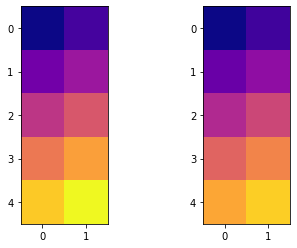

In [11]:
#https://stackoverflow.com/questions/18926031/how-to-extract-a-subset-of-a-colormap-as-a-new-colormap-in-matplotlib
    
import matplotlib.colors as colors
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

arr = np.linspace(0, 50, 10).reshape((5, 2))
fig, ax = plt.subplots(ncols=2)

cmap = plt.get_cmap('plasma')
new_cmap = truncate_colormap(cmap, 0, 0.9)
ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
plt.show()

In [12]:
projectionlist = []
colorlist = []
for mouse in dfFullSet['Mouse'].unique().tolist():
    print(mouse)
    if mouse.find('L') > 0:
        projectionlist.append('ZI-PRN')
        colorlist.append('magenta')
        
    elif mouse.find('R') > 0:
        projectionlist.append('ZI-SC')
        colorlist.append('darkturquoise')

projectdict = dict(zip(dfFullSet['Mouse'].unique().tolist(),projectionlist))
projcmap = dict(zip(dfFullSet['Mouse'].unique().tolist(),colorlist))

JAX-15F-1L
JAX-15F-1R
JAX-15F-2L
JAX-15F-2R
JAX-16F-1L
JAX-16F-1R
JAX-16F-2L
JAX-16F-2R
JAX-16F-2RB
JAX-16M-1L
JAX-16M-1R
JAX-16M-2L
JAX-16M-2R
JAX-16M-3R
JAX-17M-1L
JAX-17M-1R
JAX-17M-2L
JAX-17M-2R
JAX-17M-3L


## Plotting

In [13]:
DATA_A = trialdf[(trialdf['Day'] != 'Day4') & (trialdf['Trials Since Loom'] < 6)].groupby(['Mouse', 'Day', 'Trials Since Loom', 'Active Port'])

successrate = DATA_A['Digitized Trial Outcome'].sum() / DATA_A['Digitized Trial Outcome'].count()
session_successrate = successrate.reset_index()
session_successrate = session_successrate.rename(columns = {'Digitized Trial Outcome': 'Success Rate'})

SessionResponseTimes = DATA_A['Successful Response Time'].mean()
SessionResponseTimes = SessionResponseTimes.reset_index()

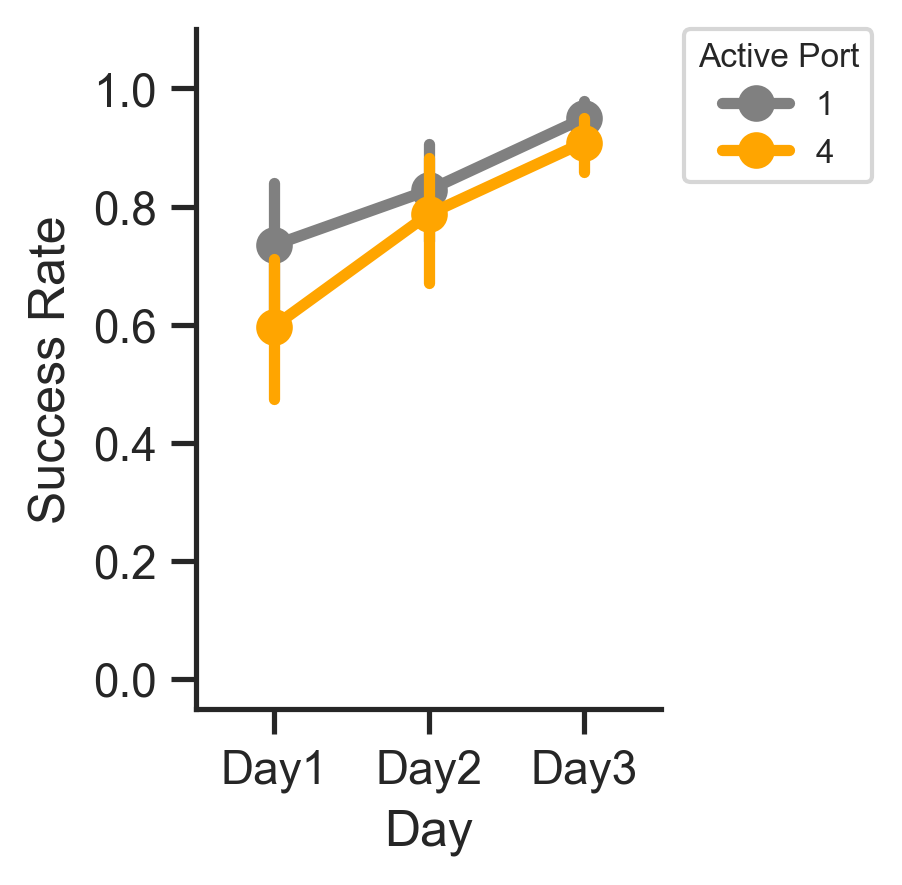

In [14]:

sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1)

sns.set_style('ticks')
plt.figure(figsize = (2,3), dpi =300)

#plt.xticks(rotation=90)


g = sns.pointplot(data=session_successrate[(session_successrate['Mouse'] != 'JAX-15F-1R') &(session_successrate['Trials Since Loom'] == -1)],
                  x = 'Day',
                  y = 'Success Rate',
                  hue = 'Active Port',
                  palette = ['grey','orange']).set(ylim=[-0.05,1.1], xlabel = 'Day',  yticks = [0.0,0.2,0.4,0.6,0.8,1.0])


sns.despine(top=True,right=True)

plt.legend(bbox_to_anchor=(1.05, 1),
           loc='upper left',
           title = 'Active Port',
           borderaxespad=0, 
           title_fontsize = 8,
           fontsize = 8)

##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/SuccessRate_vs_Days_DiffPorts.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/SuccessRate_vs_Days_DiffPorts.png', dpi=300, bbox_inches = 'tight')




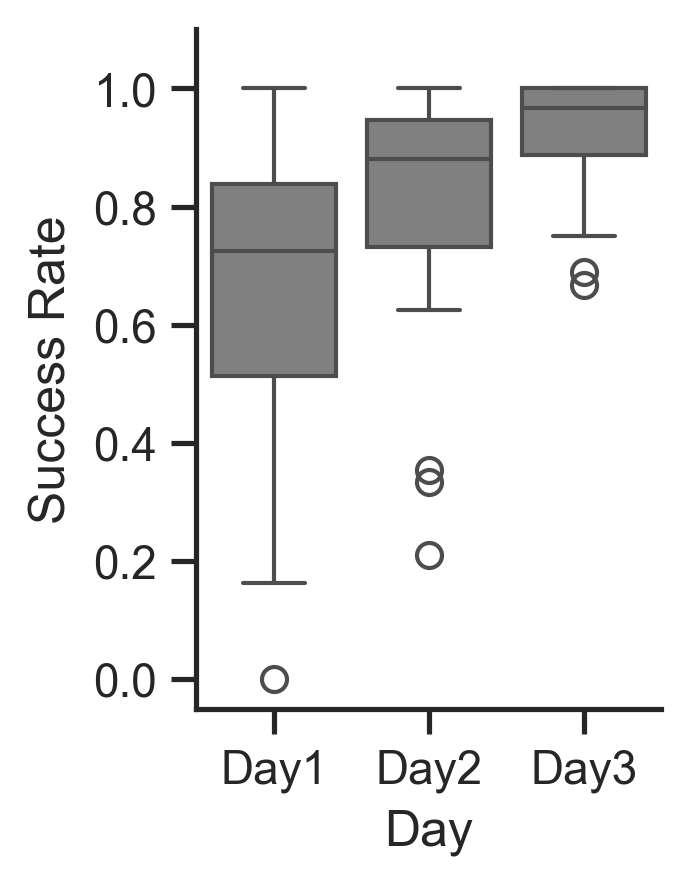

In [15]:
sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1)

sns.set_style('ticks')
plt.figure(figsize = (2,3), dpi =300)

#plt.xticks(rotation=90)


g = sns.boxplot(data=session_successrate[(session_successrate['Mouse'] != 'JAX-15F-1R') & (session_successrate['Trials Since Loom'] == -1)],
                  x = 'Day',
                  y = 'Success Rate',
                  color = 'grey').set(ylim=[-0.05,1.1], xlabel = 'Day',  yticks = [0.0,0.2,0.4,0.6,0.8,1.0])


sns.despine(top=True,right=True)

##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/SuccessRate_vs_Days.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/SuccessRate_vs_Days.png', dpi=300, bbox_inches = 'tight')


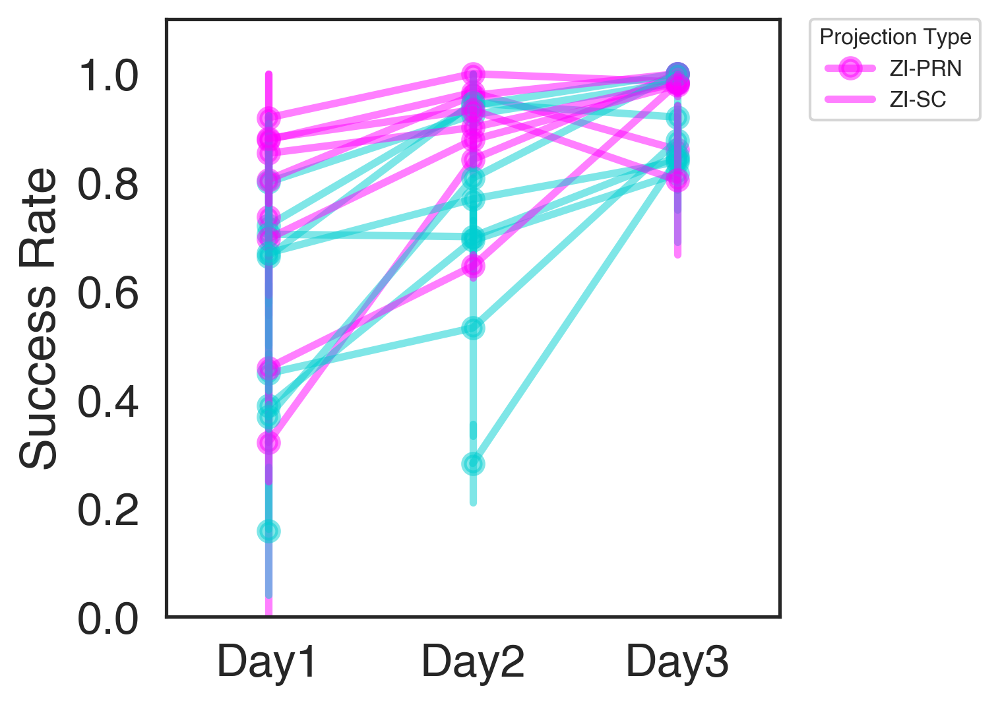

In [16]:
sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1.5)

plt.figure(figsize = (4,4), dpi =300)


mice = list(projectdict.keys())

mouse_cmap = [projcmap[i] for i in mice]

#plt.xticks(rotation=90)


sns.pointplot(data=session_successrate[(session_successrate['Trials Since Loom'] == -1)],
                  x = 'Day',
                  y = 'Success Rate',
                  hue ='Mouse',
                  alpha = 0.5,
                  hue_order = mice,
                  palette = mouse_cmap).set(ylim=[0,1.1], xlabel = '')

plt.legend(bbox_to_anchor=(1.05, 1),
           labels = ['ZI-PRN','ZI-SC'],
           loc='upper left', 
           borderaxespad=0, 
           title = 'Projection Type', 
           title_fontsize = 8,
           fontsize = 8)



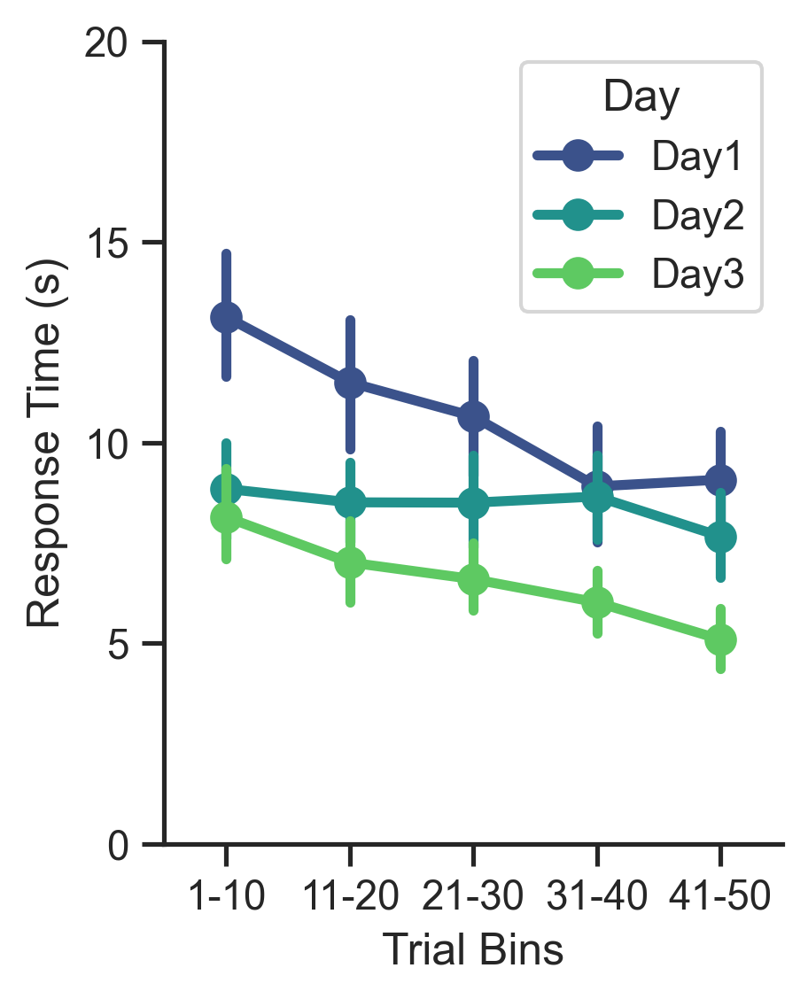

In [17]:
bins = [1,11,21,31,41,51]
trialdf['Binned Trials'] = pd.cut(trialdf['Trial Number'], bins=bins, labels = ['1-10','11-20','21-30','31-40','41-50'])

sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1)

sns.set_style('ticks')

plt.figure(figsize=(3,4), dpi = 300)
ax = sns.pointplot(data = trialdf[(trialdf['30s Trial Success']) & (trialdf['Day'] != 'Day4' ) & (trialdf['Mouse'] != 'JAX-15F-1R')],
                    x = 'Binned Trials', 
                    y = trialdf['Successful Response Time']/ 1000, 
                    hue = 'Day',
                    palette = 'viridis')
                  
ax.set_ylim(0,20)
sns.despine(top=True, right = True)

ax.set_xlabel('Trial Bins')
ax.set_ylabel('Response Time (s)')
ax.set_yticks([0,5,10,15,20])
#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/Reward_ResponseTime_Days_BinnedTrials.png', bbox_inches = 'tight',dpi =300)

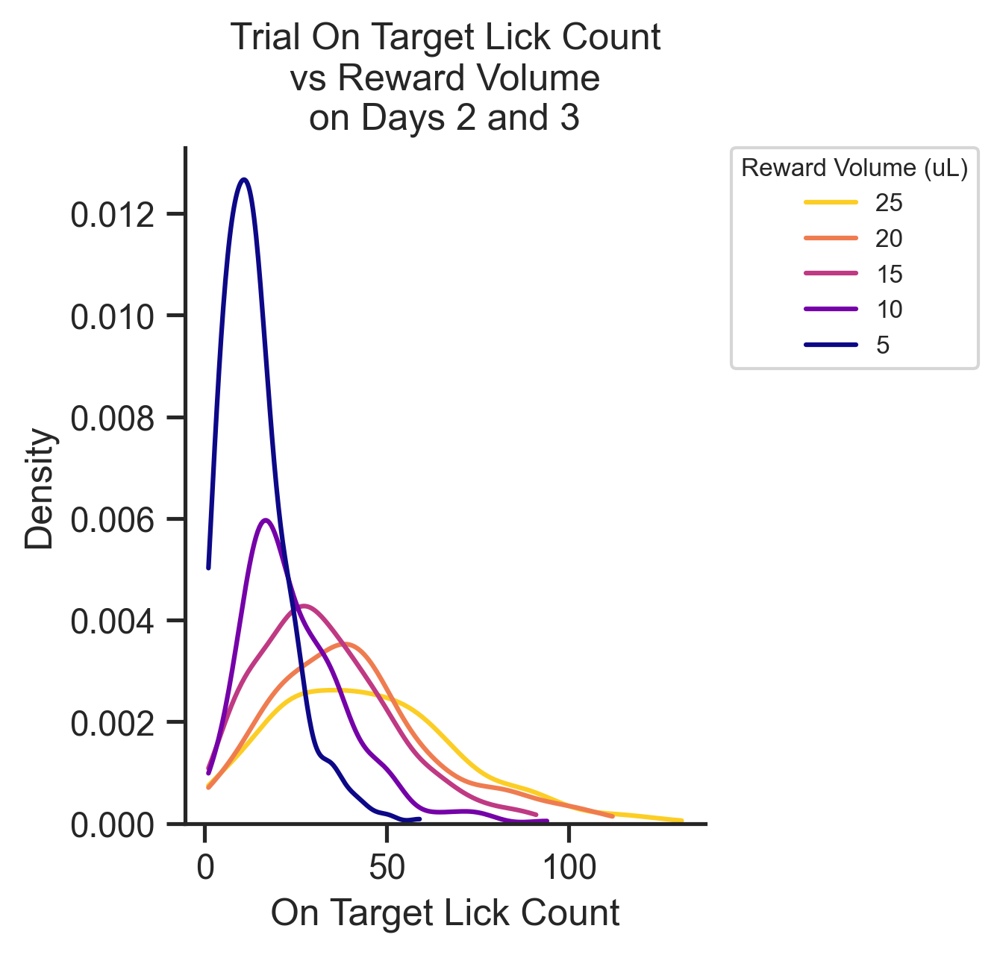

In [18]:
plt.figure(figsize = (3,4), dpi=300)

sns.kdeplot(data = trialdf[(trialdf['Day'].isin(['Day2','Day3']))],
                x = 'On Target Lick Count',
                hue = 'Volumes',
                palette = new_cmap,
                cut = 0).set(title = 'Trial On Target Lick Count\nvs Reward Volume\non Days 2 and 3')

sns.despine(top = True, right = True)

plt.legend(bbox_to_anchor=(1.05, 1),
           labels = [25, 20, 15, 10, 5],
           loc='upper left', 
           borderaxespad=0, 
           title = 'Reward Volume (uL)', 
           title_fontsize = 8,
           fontsize = 8)

#plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_OnTargetLickCount_vs_Volume_Days2&3.svg', dpi=300, bbox_inches = 'tight')
#plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_OnTargetLickCount_vs_Volume_Days2&3.png', dpi=300, bbox_inches = 'tight')


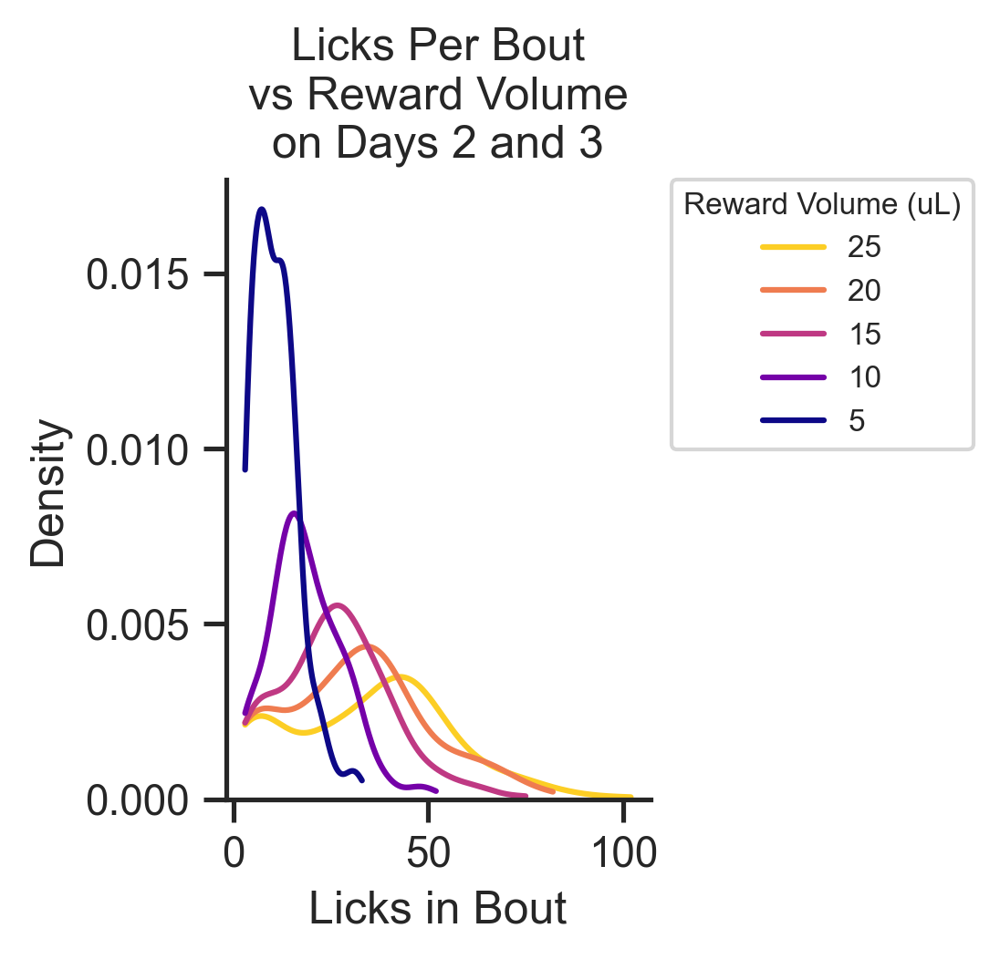

In [19]:
plt.figure(figsize = (2,3), dpi=300)

sns.kdeplot(data = sessionlickboutdf[(sessionlickboutdf['Licks in Bout'] >= 3) & 
                                      (sessionlickboutdf['On Target Lick Bout']) &
                                      (sessionlickboutdf['Day'].isin([ 'Day2', 'Day3'])) &
                                      (sessionlickboutdf['Trial Lick Bout Number'].isin([1])) &
                                     (sessionlickboutdf['Time since last lick (ms)'] > 5000)],
            cut = 0,
            x= 'Licks in Bout',
            hue = 'Most Recent Volume',
            palette = new_cmap).set(title = 'Licks Per Bout\nvs Reward Volume\non Days 2 and 3')

sns.despine(top = True, right = True)

plt.legend(bbox_to_anchor=(1.05, 1),
           labels = [25, 20, 15, 10, 5],
           loc='upper left', 
           borderaxespad=0, 
           title = 'Reward Volume (uL)', 
           title_fontsize = 8,
           fontsize = 8)

##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_LicksPerBout_vs_Volume_EitherPort_Days2&3.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_LicksPerBout_vs_Volume_EitherPort_Days2&3.png', dpi=300, bbox_inches = 'tight')


Text(0.5, 0, 'Lick Bout Duration (s)')

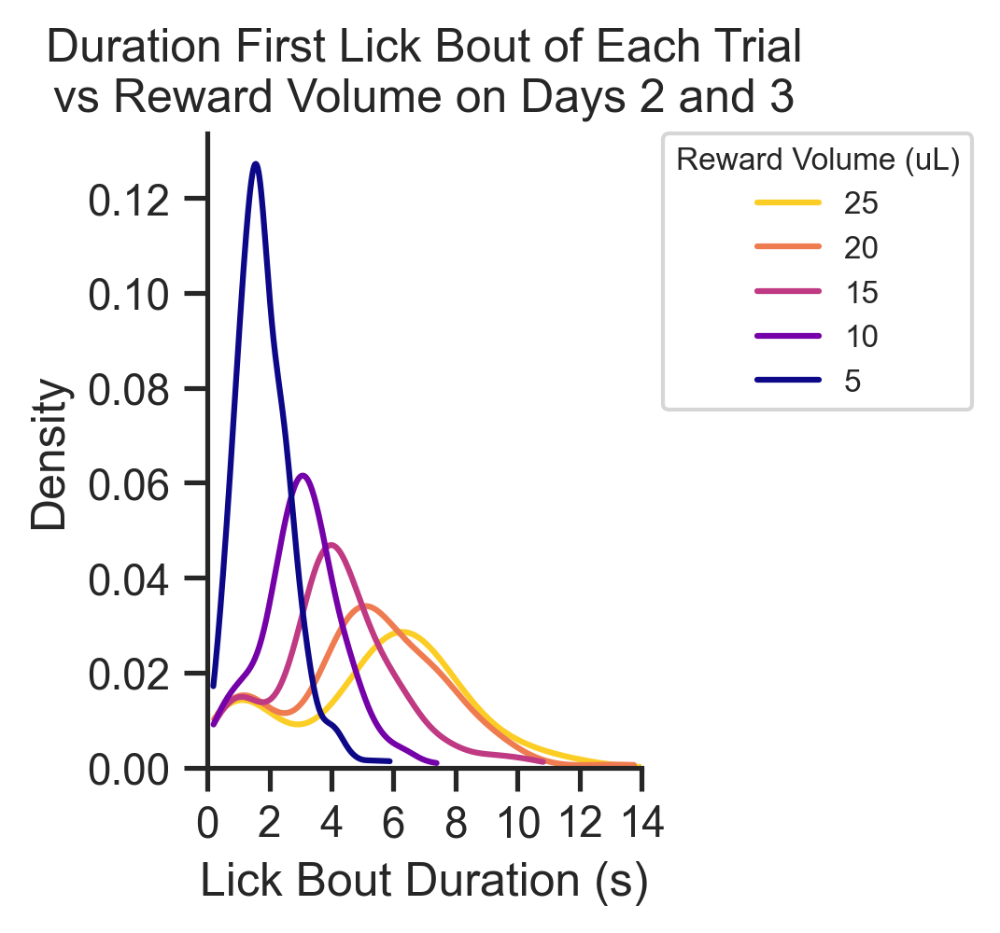

In [20]:
plt.figure(figsize = (2,3), dpi=300)

filtereddf = sessionlickboutdf[(sessionlickboutdf['Licks in Bout'] >= 3) & 
                                      (sessionlickboutdf['On Target Lick Bout']) &
                                      (sessionlickboutdf['Day'].isin([ 'Day2', 'Day3'])) &
                                      (sessionlickboutdf['Trial Lick Bout Number'].isin([1])) &
                                      (sessionlickboutdf['Time since last lick (ms)'] > 5000)]

ax1 = sns.kdeplot(data = filtereddf,
            cut = 0,
            x= filtereddf['Lick Bout Duration (ms)'] / 1000,
            hue = 'Most Recent Volume',
            palette = new_cmap)

ax1.set_title('Duration First Lick Bout of Each Trial\nvs Reward Volume on Days 2 and 3')

sns.despine(top = True, right = True)

plt.legend(bbox_to_anchor=(1.05, 1),
           labels = [25, 20, 15, 10, 5],
           loc='upper left', 
           borderaxespad=0, 
           title = 'Reward Volume (uL)', 
           title_fontsize = 8,
           fontsize = 8)

ax1.set_xticks(range(0,16,2))
               
ax1.set_xlim(0,14)

ax1.set_xlabel('Lick Bout Duration (s)')


##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/KDE_LickBoutDuration_vs_Volume_Port1_Days2&3.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/KDE_LickBoutDuration_vs_Volume_Port1_Days2&3.png', dpi=300, bbox_inches = 'tight')


(0.0, 12000.0)

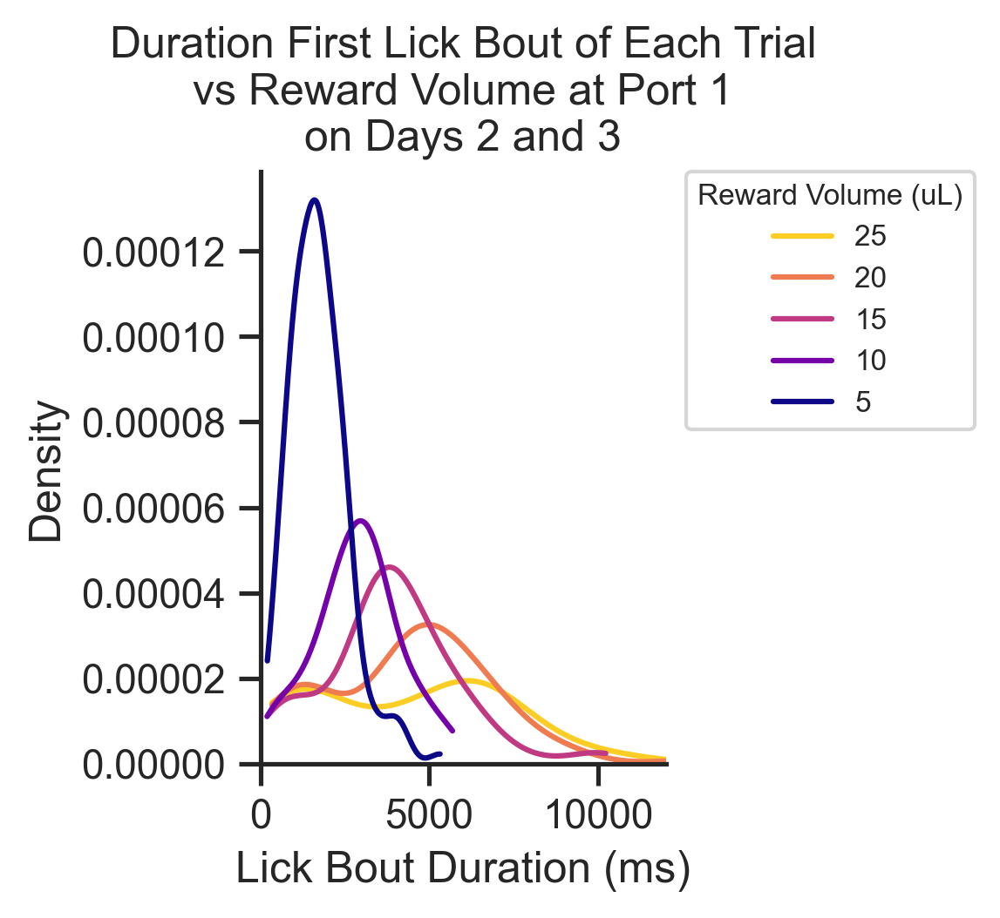

In [21]:
plt.figure(figsize = (2,3), dpi=300)

sns.kdeplot(data = sessionlickboutdf[(sessionlickboutdf['Licks in Bout'] >= 3) & 
                                      (sessionlickboutdf['On Target Lick Bout']) &
                                      (sessionlickboutdf['Day'].isin([ 'Day2', 'Day3'])) &
                                      (sessionlickboutdf['Trial Lick Bout Number'].isin([1])) &
                                      (sessionlickboutdf['Active Port'] == 1) &
                                      (sessionlickboutdf['Time since last lick (ms)'] > 5000)],
            cut = 0,
            x= 'Lick Bout Duration (ms)',
            hue = 'Most Recent Volume',
            palette = new_cmap).set(title = 'Duration First Lick Bout of Each Trial\nvs Reward Volume at Port 1\non Days 2 and 3')

sns.despine(top = True, right = True)

plt.legend(bbox_to_anchor=(1.05, 1),
           labels = [25, 20, 15, 10, 5],
           loc='upper left', 
           borderaxespad=0, 
           title = 'Reward Volume (uL)', 
           title_fontsize = 8,
           fontsize = 8)

plt.xlim(0,12000)

#plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_LickBoutDuration_vs_Volume_Port4_Days2&3.svg', dpi=300, bbox_inches = 'tight')
#plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_LickBoutDuration_vs_Volume_Port4_Days2&3.png', dpi=300, bbox_inches = 'tight')


(0.0, 12000.0)

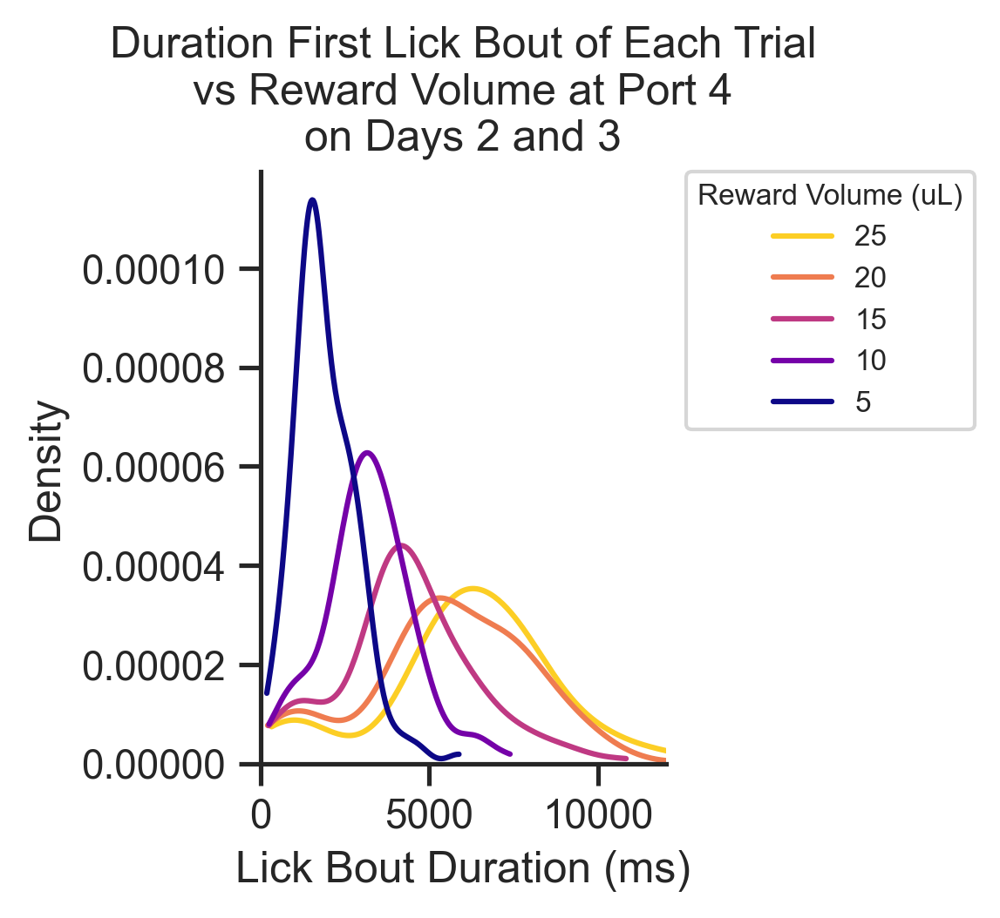

In [22]:
plt.figure(figsize = (2,3), dpi=300)

sns.kdeplot(data = sessionlickboutdf[(sessionlickboutdf['Licks in Bout'] >= 3) & 
                                      (sessionlickboutdf['On Target Lick Bout']) &
                                      (sessionlickboutdf['Day'].isin([ 'Day2', 'Day3'])) &
                                      (sessionlickboutdf['Trial Lick Bout Number'].isin([1])) &
                                      (sessionlickboutdf['Active Port'] == 4) &
                                      (sessionlickboutdf['Time since last lick (ms)'] > 5000)],
            cut = 0,
            x= 'Lick Bout Duration (ms)',
            hue = 'Most Recent Volume',
            palette = new_cmap).set(title = 'Duration First Lick Bout of Each Trial\nvs Reward Volume at Port 4\non Days 2 and 3')

sns.despine(top = True, right = True)

plt.legend(bbox_to_anchor=(1.05, 1),
           labels = [25, 20, 15, 10, 5],
           loc='upper left', 
           borderaxespad=0, 
           title = 'Reward Volume (uL)', 
           title_fontsize = 8,
           fontsize = 8)

plt.xlim(0,12000)

#plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_LickBoutDuration_vs_Volume_Port4_Days2&3.svg', dpi=300, bbox_inches = 'tight')
#plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/KDE_LickBoutDuration_vs_Volume_Port4_Days2&3.png', dpi=300, bbox_inches = 'tight')


/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1663459681.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  g = sns.lineplot(data = sessionlickboutdf[(sessionlickboutdf['Day'].isin(['Day4'])) &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1663459681.py:30: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  leg.legendHandles[0].set_color('cyan')
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1663459681.py:31: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  leg.legendHandles[1].set_color('magenta')


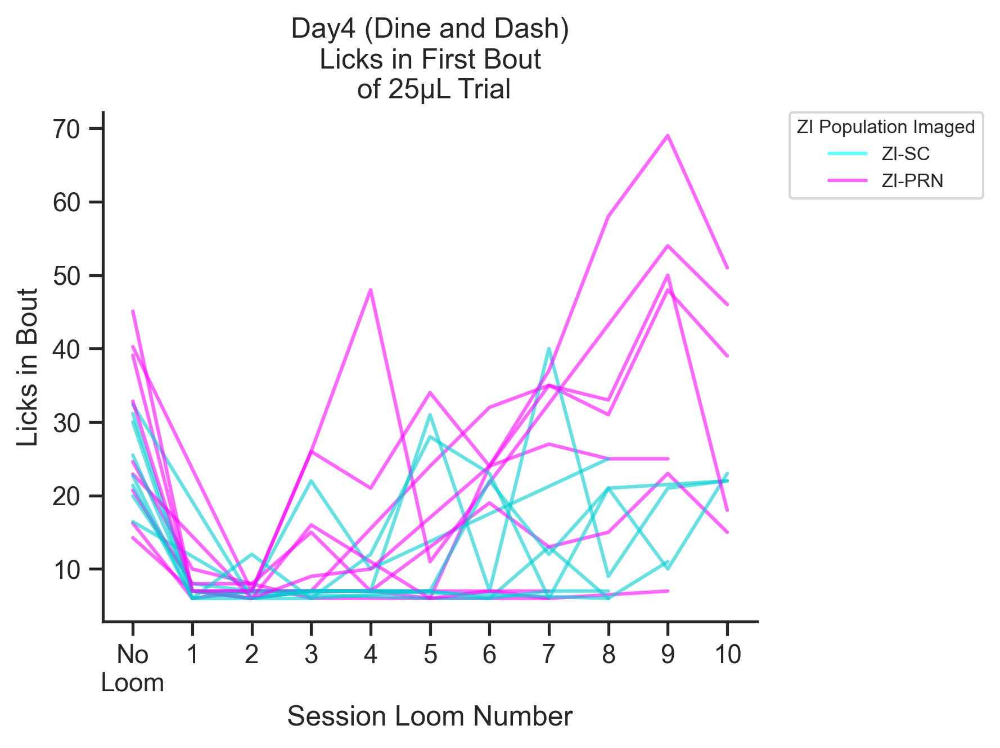

In [24]:
plt.figure(figsize = (5,4), dpi=300)
proj_palette = [projcmap[x] for x in trialdf['Mouse'].unique().tolist()]

g = sns.lineplot(data = sessionlickboutdf[(sessionlickboutdf['Day'].isin(['Day4'])) &
                                      (sessionlickboutdf['Session Loom Number'] < 11) &
                                      (sessionlickboutdf['Most Recent Volume'] == 2000) &
                                      ((sessionlickboutdf['Session Loom Number'] == 0) | (sessionlickboutdf['Lick Bout with Loom'])) &
                                      (sessionlickboutdf['Trial Lick Bout Number'].isin([1]))],
            x = 'Session Loom Number',
            y= 'Licks in Bout',
            hue = 'Mouse',
            hue_order = trialdf['Mouse'].unique().tolist(),
            palette = proj_palette,
            ci = None,
            alpha = 0.6)
g.set_xticks([0,1,2,3,4,5,6,7,8,9,10])
g.set_xticklabels(['No\nLoom',1,2,3,4,5,6,7,8,9,10])
g.set(title = 'Day4 (Dine and Dash)\nLicks in First Bout\n of 25µL Trial')

sns.despine(top = True, right = True)

leg = plt.legend(bbox_to_anchor=(1.05, 1),
           loc='upper left', 
           borderaxespad=0, 
           title = 'ZI Population Imaged', 
           labels = ['ZI-SC', 'ZI-PRN'],
           title_fontsize = 8,
           fontsize = 8)

leg.legendHandles[0].set_color('cyan')
leg.legendHandles[1].set_color('magenta')

#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/LinePlot_LicksInFirst25uLBout_vs_LoomNum_ProjectType.svg', dpi=300, bbox_inches = 'tight')
#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/LinePlot_LicksInFirst25uLBout_vs_LoomNum_ProjectType.png', dpi=300, bbox_inches = 'tight')

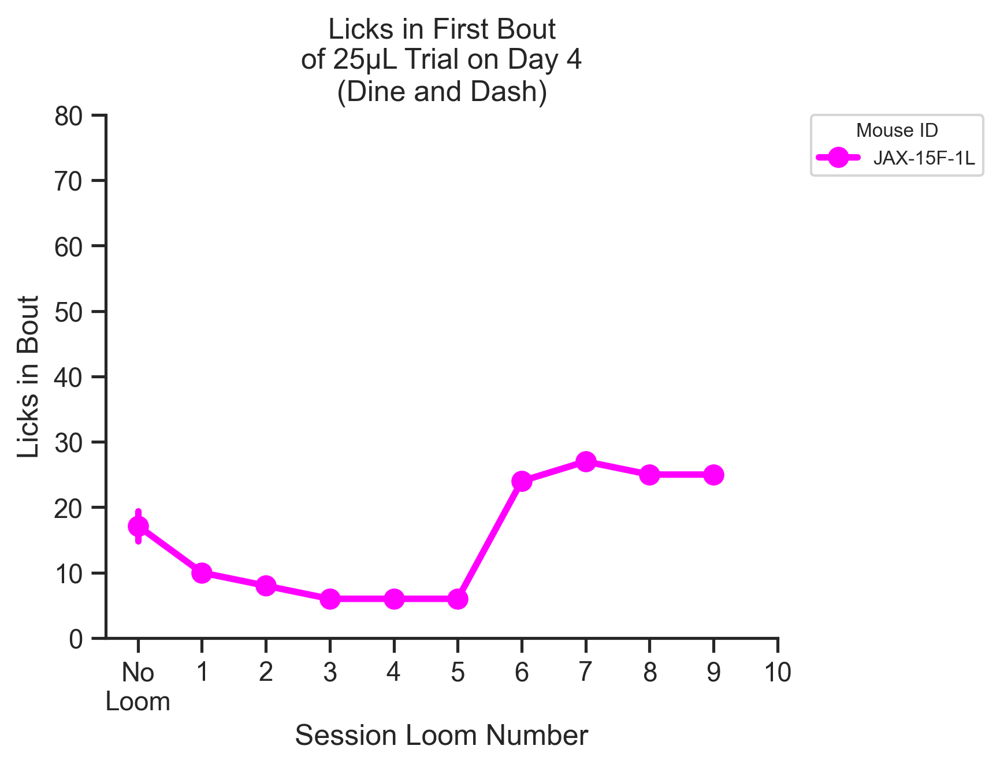

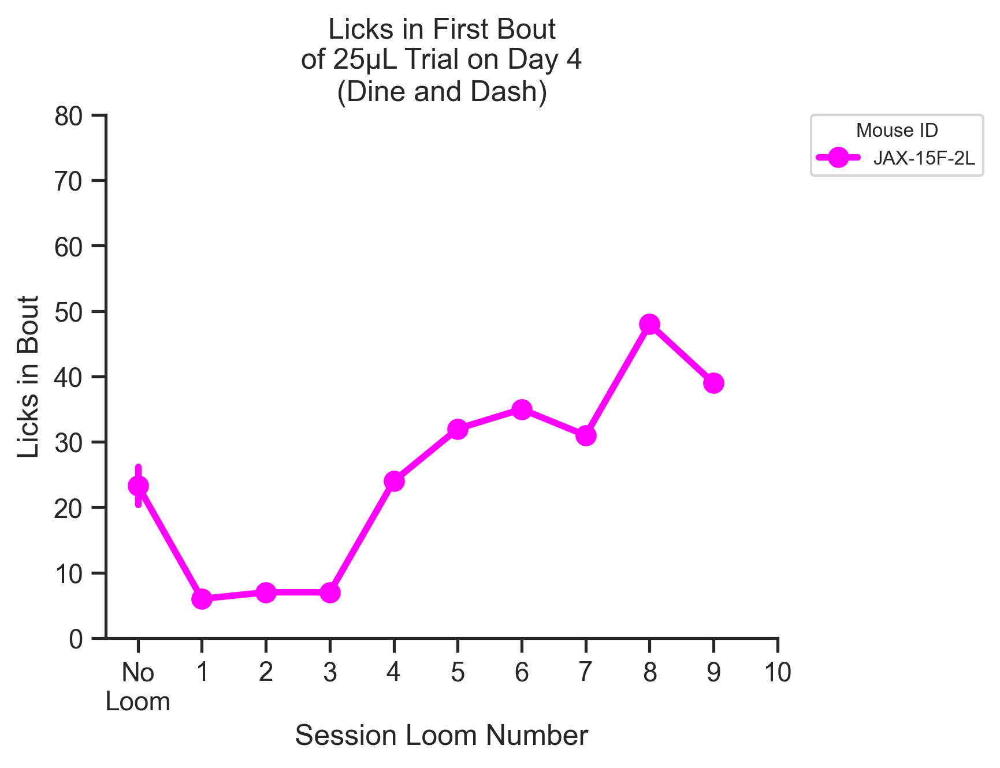

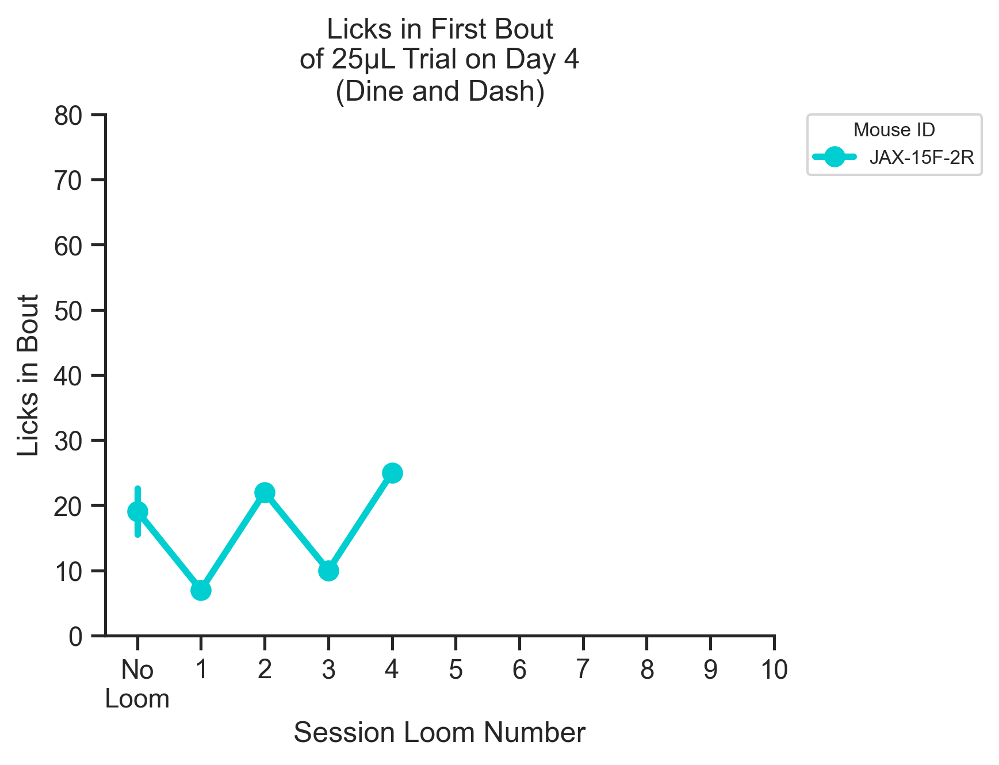

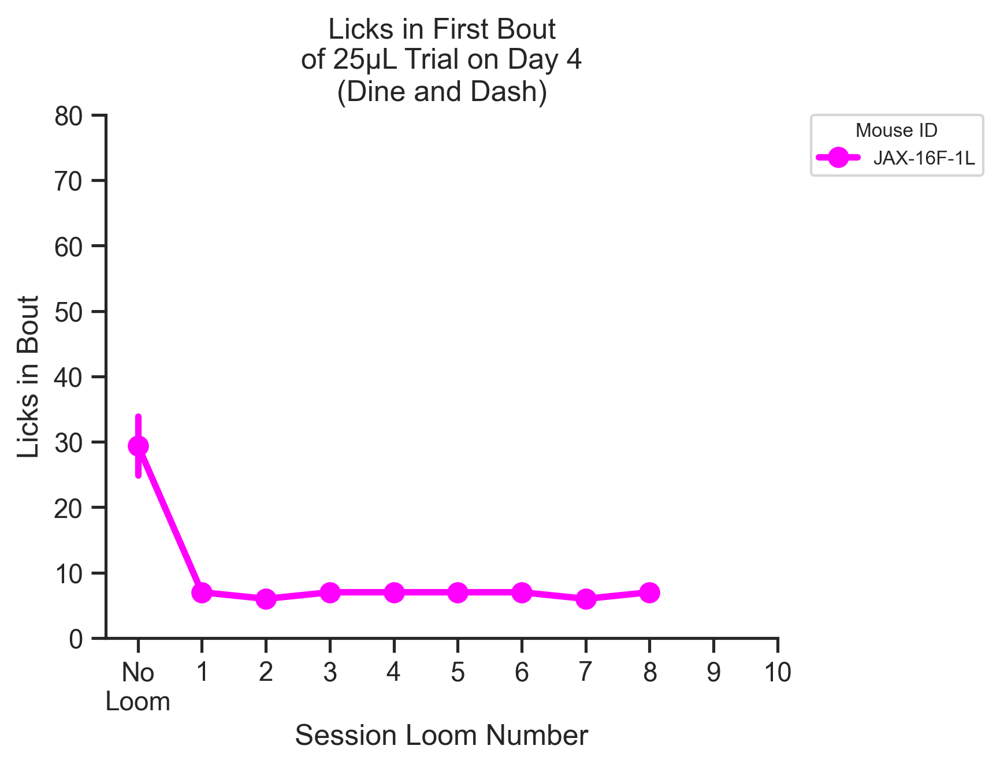

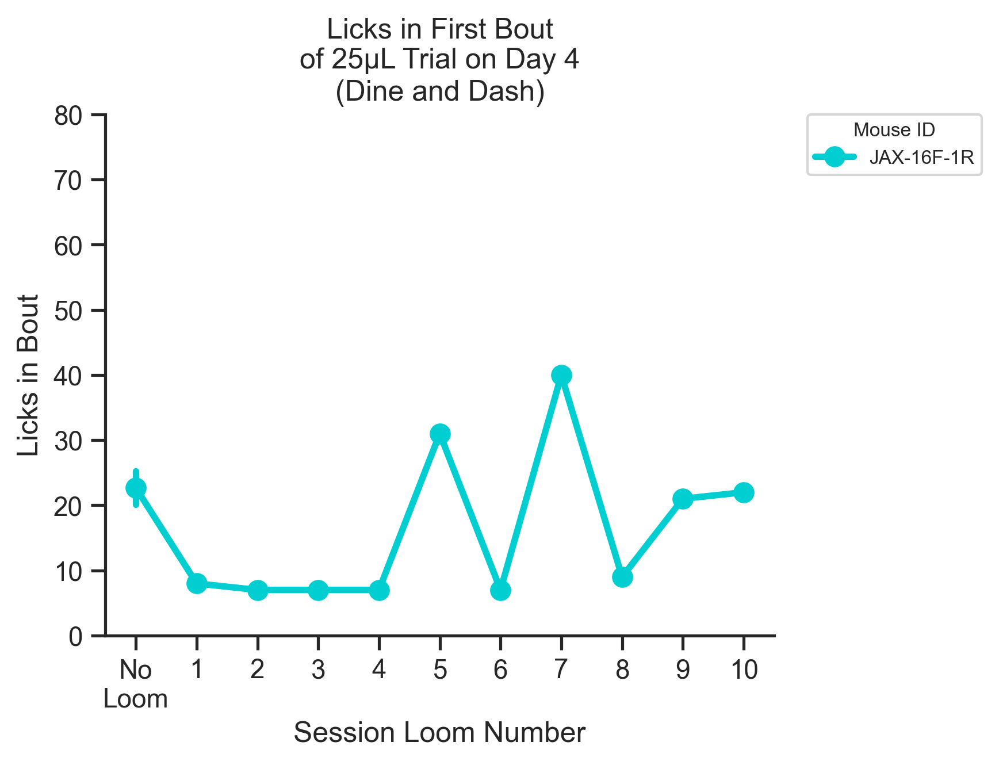

...

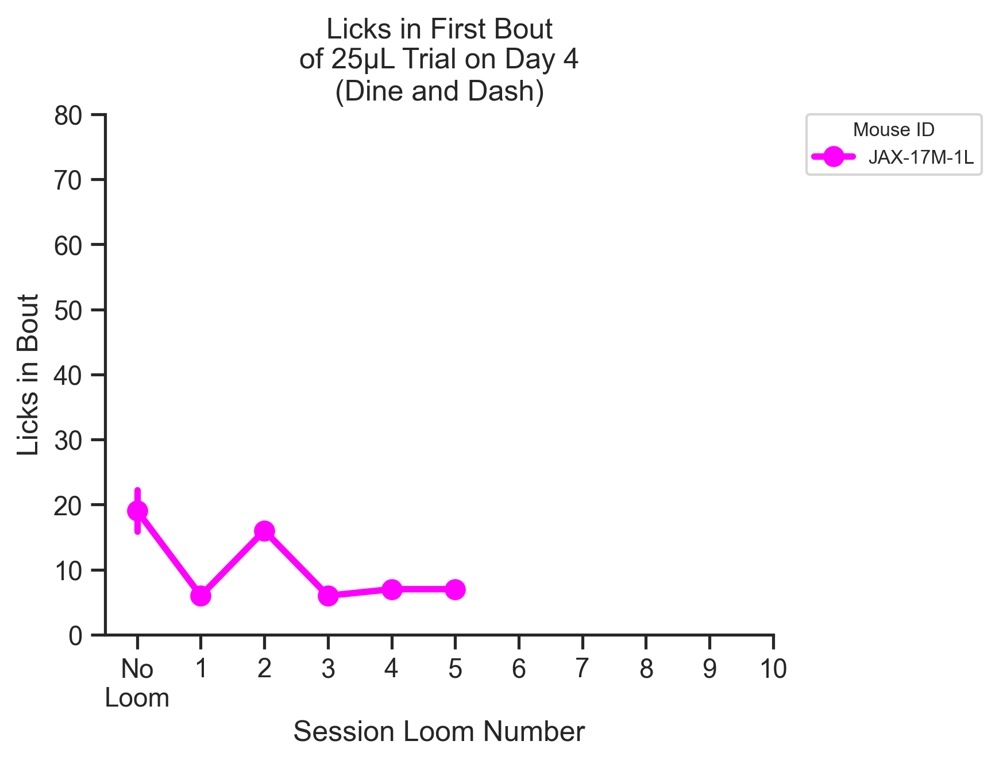

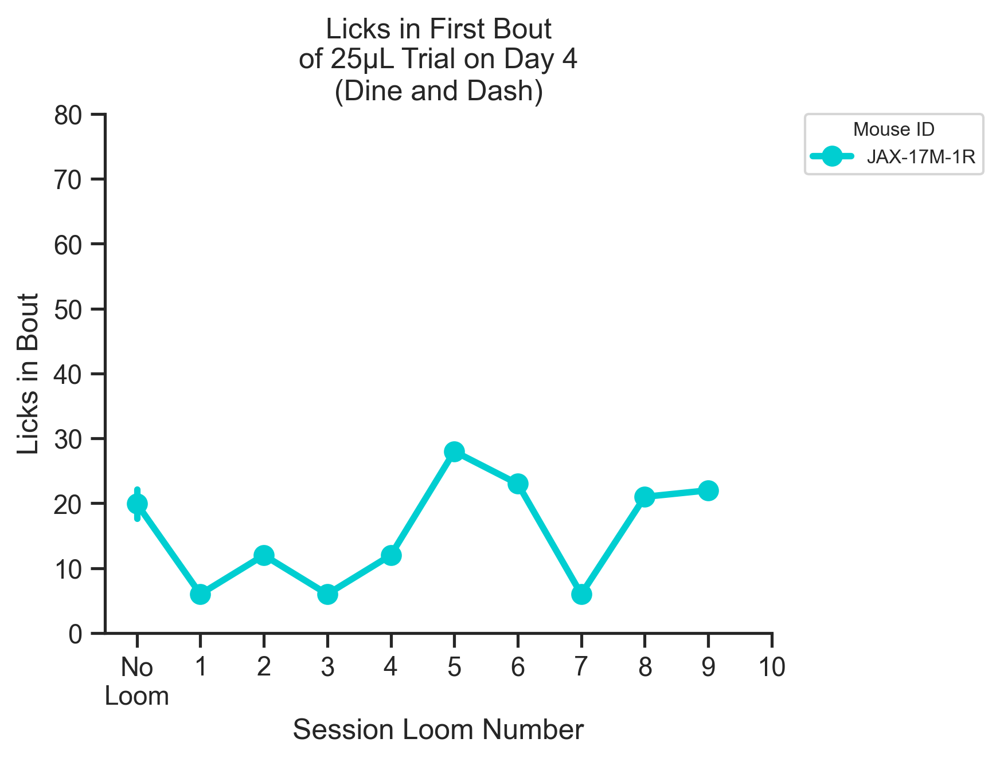

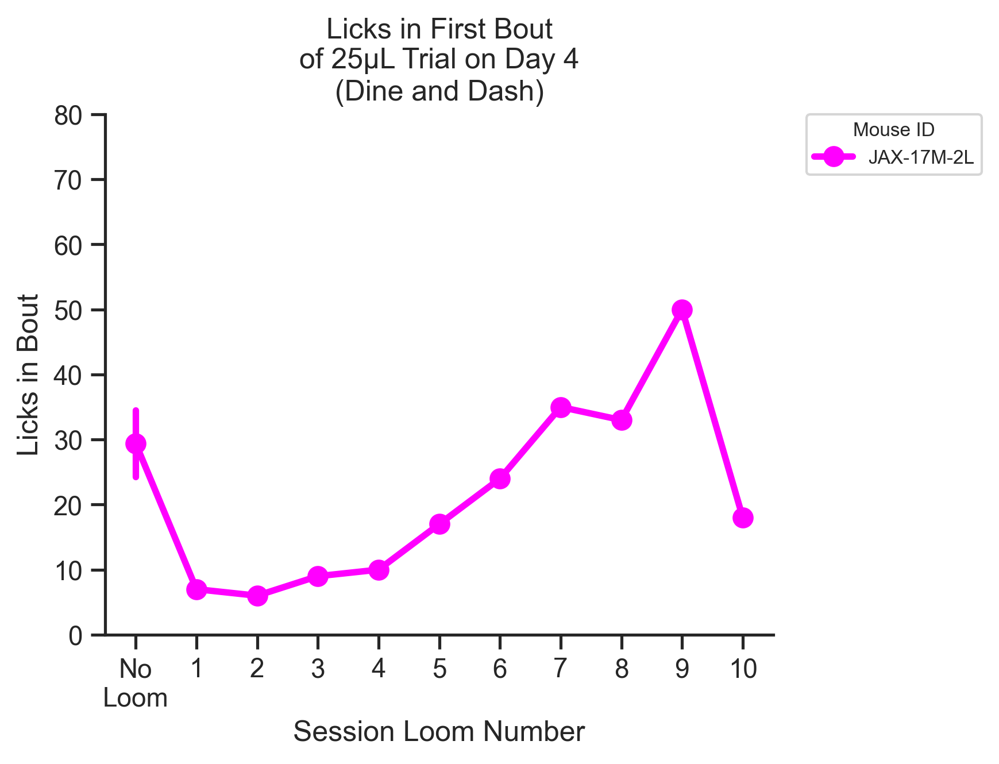

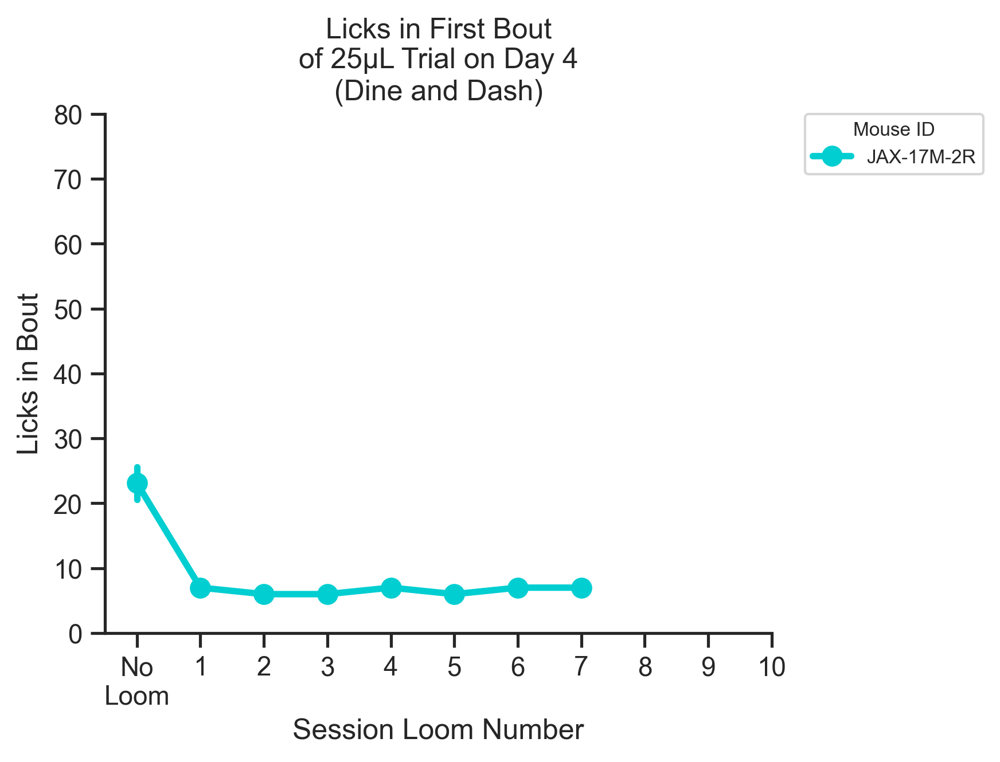

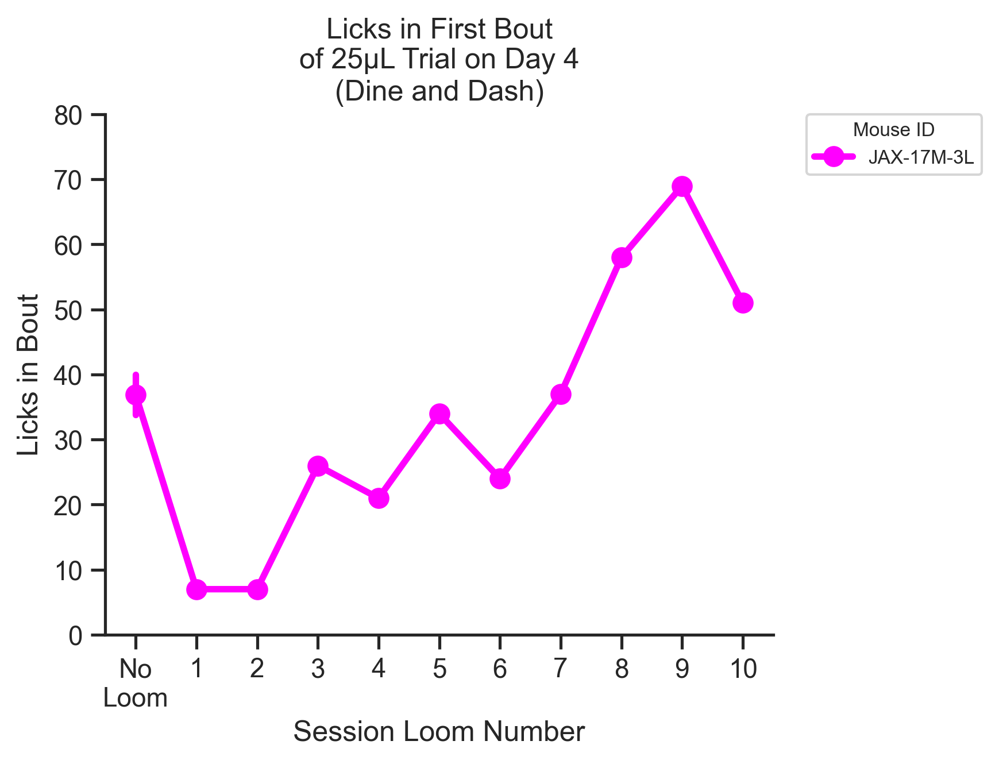

In [25]:

for mouse in sessionlickboutdf[sessionlickboutdf['Day'] == 'Day4']['Mouse'].unique().tolist():
    plt.figure(figsize = (5,4), dpi=300)
    proj_palette = [projcmap[x] for x in trialdf['Mouse'].unique().tolist()]

    g = sns.pointplot(data = sessionlickboutdf[ (sessionlickboutdf['Mouse'] == mouse) &
                                           (sessionlickboutdf['Day'].isin(['Day4'])) &
                                          (sessionlickboutdf['Session Loom Number'] < 11) &
                                          (sessionlickboutdf['Most Recent Volume'] >= 1000) &
                                          ((sessionlickboutdf['Session Loom Number'] == 0) | (sessionlickboutdf['Lick Bout with Loom'])) &
                                          (sessionlickboutdf['Trial Lick Bout Number'].isin([1]))],
                x = 'Session Loom Number',
                y= 'Licks in Bout',
                hue = 'Mouse',
                errorbar = 'se',
                palette = [projcmap[mouse]])
    
    g.set_xticks([0,1,2,3,4,5,6,7,8,9,10])
    g.set_xticklabels(['No\nLoom',1,2,3,4,5,6,7,8,9,10])
    g.set(title = 'Licks in First Bout\nof 25µL Trial on Day 4\n(Dine and Dash)', ylim = (0,80))

    sns.despine(top = True, right = True)

    leg = plt.legend(bbox_to_anchor=(1.05, 1),
               loc='upper left', 
               borderaxespad=0, 
               title = 'Mouse ID', 
               title_fontsize = 8,
               fontsize = 8)

    #leg.legendHandles[0].set_color('cyan')
    #leg.legendHandles[1].set_color('magenta')

    #plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/LinePlot_LicksInFirst25uLBout_vs_LoomNum_' + mouse + '.svg', dpi=300, bbox_inches = 'tight')
    #plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/LinePlot_LicksInFirst25uLBout_vs_LoomNum' + mouse + '.png', dpi=300, bbox_inches = 'tight')

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/4149108931.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.boxplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/4149108931.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size 

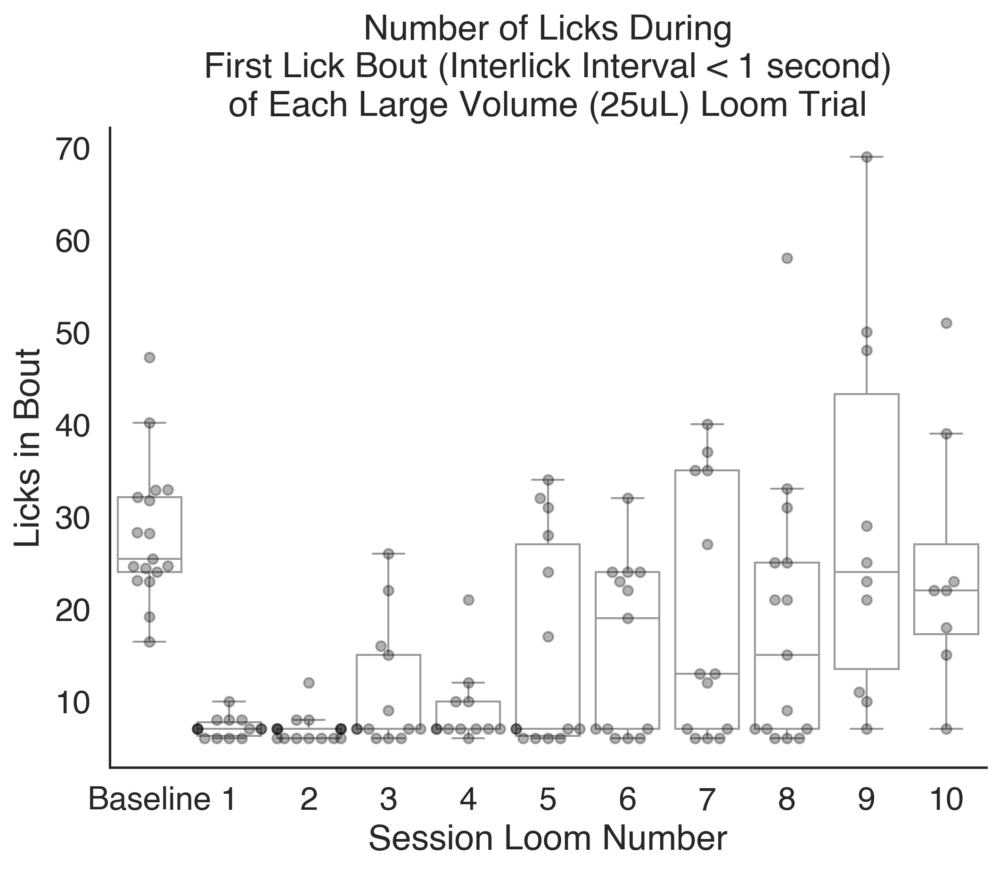

In [52]:
sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1.5)

plt.figure(figsize = (8,6), dpi =300)

DATA_N = sessionlickboutdf[sessionlickboutdf['Mouse'] != 'JAX-16M-1L']
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Bout'])['Session Lick Bout Number'].idxmin()].reset_index(drop=True)

ax = sns.boxplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'white',
             showfliers=False)

ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
              x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'black',
             edgecolor = 'black',
             linewidth = 1,
             dodge = True,
             size = 5,
             alpha = 0.3)

ax.set_xticklabels(['Baseline','1','2','3','4','5','6','7','8','9','10'])

sns.despine(top = True, right = True)

plt.title('Number of Licks During\nFirst Lick Bout (Interlick Interval < 1 second)\nof Each Large Volume (25uL) Loom Trial')

plt.legend([],[], frameon=False)

plt.savefig('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/BoxSwarm_OnTargetLickCount_vs_SessionLoomNumberTo10_072224.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/LicksInBout_vs_LoomNum.png', dpi=300, bbox_inches = 'tight')

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1262371360.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.boxplot(data = AAA[(AAA['Day'] == 'Day4') &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1262371360.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') &
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ry

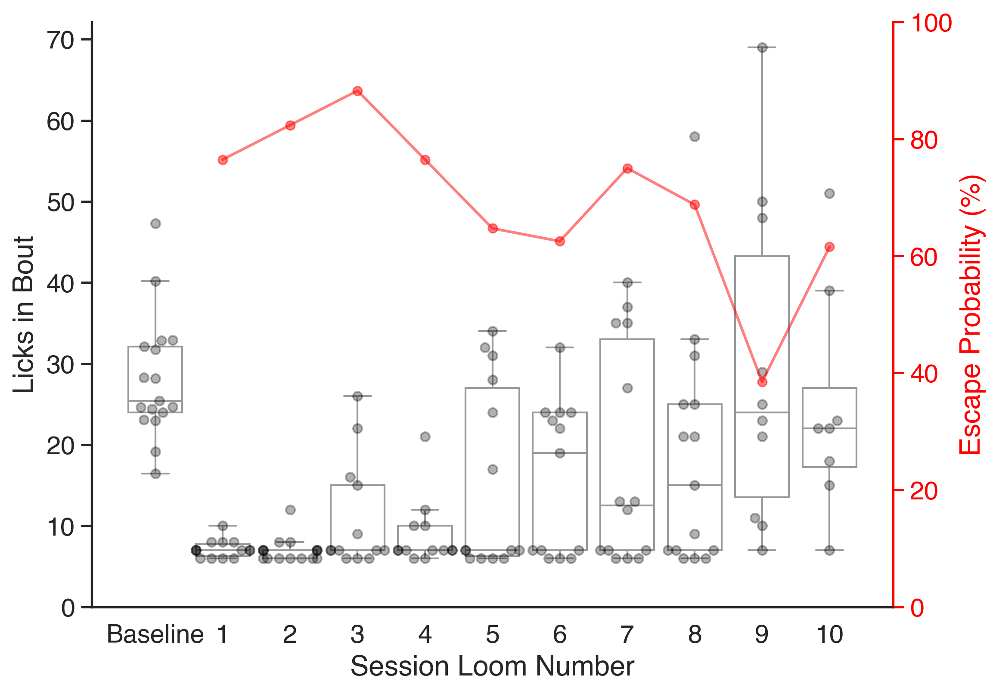

In [134]:
plt.figure(figsize = (8,6), dpi =300)

sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1.3)

DATA_N = sessionlickboutdf[sessionlickboutdf['Mouse'] != 'JAX-16M-1L']
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Bout'])['Session Lick Bout Number'].idxmin()].reset_index(drop=True)

ax = sns.boxplot(data = AAA[(AAA['Day'] == 'Day4') &
                            ((AAA['Session Loom Number'] == 0) & (AAA['Most Recent Volume'] == 2000)) | (AAA['Lick Bout with Loom']) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'white',
             showfliers=False)

ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') &
                            ((AAA['Session Loom Number'] == 0) & (AAA['Most Recent Volume'] == 2000)) | (AAA['Lick Bout with Loom']) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
              x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'black',
             edgecolor = 'black',
             linewidth = 1,
             dodge = True,
             size = 5,
             alpha = 0.3)

ax.set_xticklabels(['Baseline','1','2','3','4','5','6','7','8','9','10'])

ax.set_yticks(range(0,80,10))



DATA_A = loomresponsedf[loomresponsedf['Mouse'] != 'JAX-16M-1L'].groupby(['Session Loom Number']).mean().reset_index()

ax2 = ax.twinx()
ax2.yaxis.set_tick_params(color='red', labelcolor='red') # color the ticks and labels red
ax2.spines['right'].set_color('red') # color the spine red



ax2 = sns.lineplot(data = DATA_A[DATA_A['Session Loom Number'] < 11], x = 'Session Loom Number', y = DATA_A['Escape Success'] * 100, color = 'red',alpha =0.5, marker='o',
             markersize=5, markerfacecolor='red',markeredgecolor = 'red')

ax2.set_ylim(0,100)
ax2.set_ylabel('Escape Probability (%)', color = 'red')



#plt.title('Number of Licks During\nFirst Lick Bout (Interlick Interval < 1 second)\nof Each Large Volume (25uL) Loom Trial')
sns.despine(top = True, right = False)
plt.legend([],[], frameon=False)


plt.savefig('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/LickNum_vs_LoomNum_EscapeProb_072224.svg', dpi=300, bbox_inches = 'tight')



/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1135599786.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.barplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/1135599786.py:15: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size o

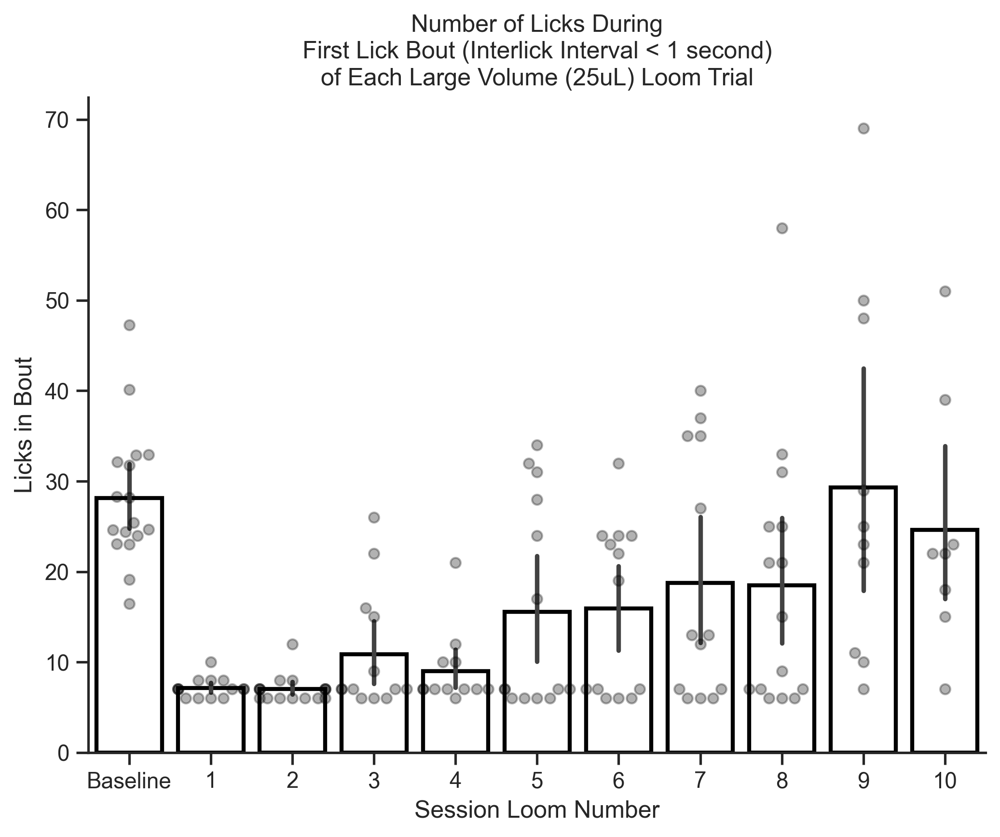

In [46]:
plt.figure(figsize = (8,6), dpi =300)

DATA_N = sessionlickboutdf[sessionlickboutdf['Mouse'] != 'JAX-16M-1L']
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Bout'])['Session Lick Bout Number'].idxmin()].reset_index(drop=True)

ax = sns.barplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'white',
             edgecolor = 'black',
             linewidth = 2)

ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
              x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'black',
             edgecolor = 'black',
             linewidth = 1,
             dodge = True,
             size = 5,
             alpha = 0.3)

ax.set_xticklabels(['Baseline','1','2','3','4','5','6','7','8','9','10'])

sns.despine(top = True, right = True)

plt.title('Number of Licks During\nFirst Lick Bout (Interlick Interval < 1 second)\nof Each Large Volume (25uL) Loom Trial')

plt.legend([],[], frameon=False)

#plt.savefig('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/BoxSwarm_OnTargetLickCount_vs_SessionLoomNumberTo10_072224.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/LicksInBout_vs_LoomNum.png', dpi=300, bbox_inches = 'tight')

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/2623671259.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  DATA_B = loomresponsedf[loomresponsedf['Session Loom Number'] < 11].groupby('Mouse').mean().reset_index()
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_48492/2623671259.py:9: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': 'black'}` instead.

  ax = sns.barplot(y = DATA_B['Escape Success'] * 100, edgecolor = 'grey', fill = False, linewidth = 1.5, errcolor= 'black')


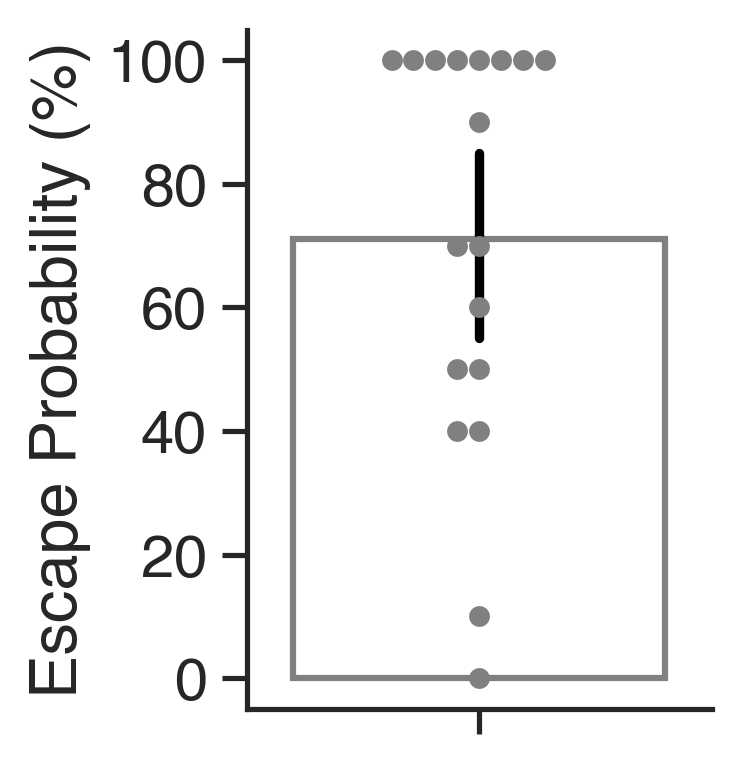

In [118]:
DATA_B = loomresponsedf[loomresponsedf['Session Loom Number'] < 11].groupby('Mouse').mean().reset_index()

sns.set_theme(style = 'ticks', 
              font = 'Helvetica',
              font_scale = 1.3)

plt.figure(figsize =(2,3), dpi = 300)

ax = sns.barplot(y = DATA_B['Escape Success'] * 100, edgecolor = 'grey', fill = False, linewidth = 1.5, errcolor= 'black')
sns.swarmplot(data =DATA_B, y = DATA_B['Escape Success'] * 100, color = 'grey')
plt.ylim(0,110)
ax.set_ylabel('Escape Probability (%)')
ax.set_yticks([0,20,40,60,80,100])
ax.set_ylim([-5,105])
sns.despine(top = True, right = True)

plt.savefig('/Volumes/ryanKast/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/EscapeProbability_First10Looms_072224.svg', dpi=300, bbox_inches = 'tight')

In [105]:
loomresponsedf.Mouse

0              JAX-15F-1L
1              JAX-15F-1L
2              JAX-15F-1L
3              JAX-15F-1L
4              JAX-15F-1L
5              JAX-15F-1L
6              JAX-15F-1L
7              JAX-15F-1L
8              JAX-15F-1L
9              JAX-15F-1L
10             JAX-15F-1L
11             JAX-15F-1L
12             JAX-15F-1L
13             JAX-15F-1L
14             JAX-15F-1L
15             JAX-15F-1L
16             JAX-15F-1L
17      JAX-15F-1L_Manual
18             JAX-15F-2L
19             JAX-15F-2L
20             JAX-15F-2L
21             JAX-15F-2L
22             JAX-15F-2L
23             JAX-15F-2L
24             JAX-15F-2L
25             JAX-15F-2L
26             JAX-15F-2L
27             JAX-15F-2L
28             JAX-15F-2L
29             JAX-15F-2L
30      JAX-15F-2L_Manual
31      JAX-15F-2L_Manual
32             JAX-15F-2R
33             JAX-15F-2R
34             JAX-15F-2R
35             JAX-15F-2R
36             JAX-15F-2R
37             JAX-15F-2R
38          

In [117]:
x = [i for i in loomresponsedf.Mouse.unique().tolist() if i.find('Manual') > 0]
y = [i[:i.find('_Manual')] for i in x]

loomresponsedf = loomresponsedf.replace(dict(zip(x,y)))

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_38983/1213750739.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.boxplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_38983/1213750739.py:14: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size o

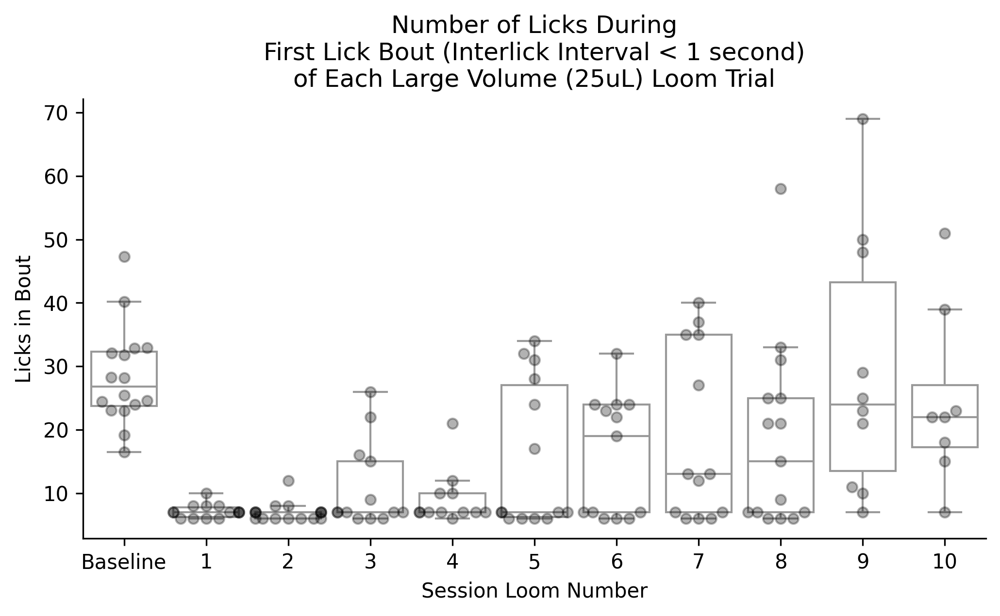

In [33]:
plt.figure(figsize = (8,4), dpi =300)

DATA_N = sessionlickboutdf[~sessionlickboutdf['Mouse'].isin(['JAX-16M-1L','JAX-16M-1R'])]
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Bout'])['Session Lick Bout Number'].idxmin()].reset_index(drop=True)

ax = sns.boxplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'white',
             showfliers=False)

ax = sns.swarmplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
              x = 'Session Loom Number',
             y = 'Licks in Bout',
             color = 'black',
             edgecolor = 'black',
             linewidth = 1,
             dodge = True,
             size = 5,
             alpha = 0.3)

ax.set_xticklabels(['Baseline','1','2','3','4','5','6','7','8','9','10'])

sns.despine(top = True, right = True)

plt.title('Number of Licks During\nFirst Lick Bout (Interlick Interval < 1 second)\nof Each Large Volume (25uL) Loom Trial')

plt.legend([],[], frameon=False)

##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/LicksInBout_vs_LoomNum.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('/Users/ryankast/Documents/FengLab/Manuscripts/ZI_CellTypes/V4/Fig5/LicksInBout_vs_LoomNum.png', dpi=300, bbox_inches = 'tight')

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_77102/2374171859.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.lineplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_77102/2374171859.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['Baseline','1','2','3','4','5','6','7','8','9','10'])


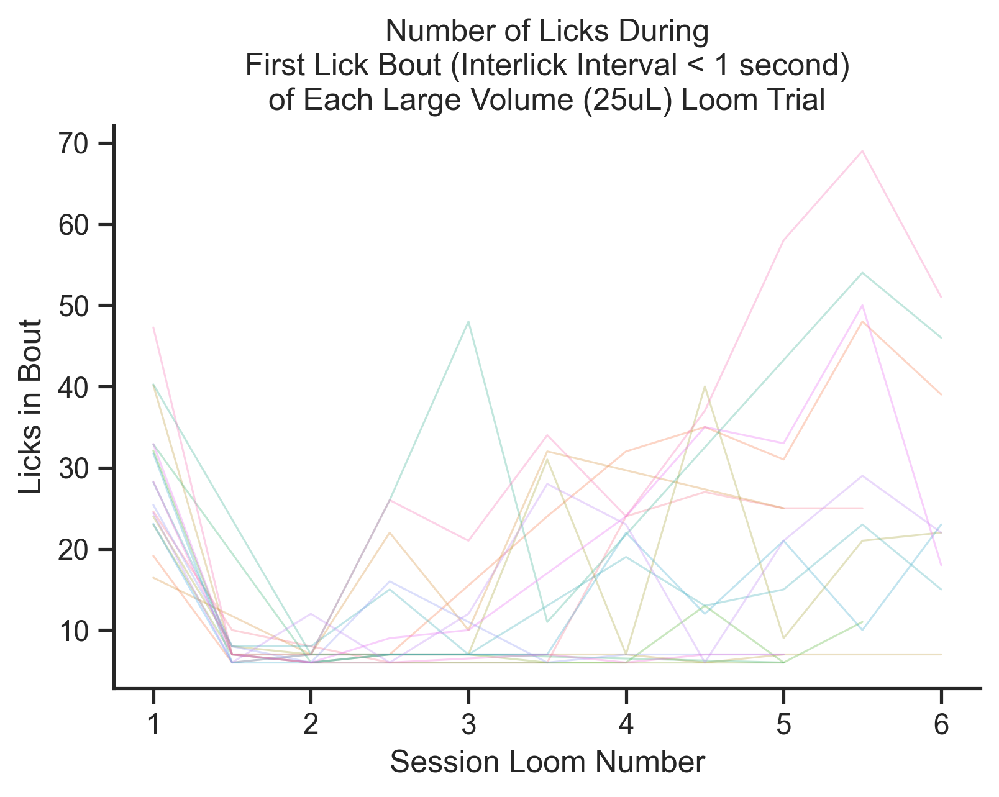

In [256]:
plt.figure(figsize = (6,4), dpi =300)

DATA_N = sessionlickboutdf
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Bout'])['Session Lick Bout Number'].idxmin()].reset_index(drop=True)



ax = sns.lineplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
              x = 'Session Loom Number',
             hue = 'Mouse',
             y = 'Licks in Bout',
             color = 'black',
             linewidth = 1,
             size = 5,
             alpha = 0.3)

ax.set_xticklabels(['Baseline','1','2','3','4','5','6','7','8','9','10'])

sns.despine(top = True, right = True)

plt.title('Number of Licks During\nFirst Lick Bout (Interlick Interval < 1 second)\nof Each Large Volume (25uL) Loom Trial')

plt.legend([],[], frameon=False)

##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/BoxStrip_LicksInFirst25uLEpoch_vs_LoomNum.svg', dpi=300, bbox_inches = 'tight')
##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/BoxStrip_LicksInFirst25uLEpoch_vs_LoomNum.png', dpi=300, bbox_inches = 'tight')

In [1481]:
dest_dir = 'Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DLC_DineAndDash/'

for (mouse,day,AP), group in dfFullSet[dfFullSet['Day'] == 'Day4'].groupby(['Mouse','Day', 'Active Port']):
    df = pd.DataFrame()
    df['ON timestamps'] = group[group['Event'].str.contains('started')]['Guppy Timestamps (s)'].reset_index(drop = True)
    df['OFF timestamps'] = group[group['Event'].str.contains('is ending')]['Guppy Timestamps (s)'].reset_index(drop = True)
    df.to_csv(dest_dir + mouse + '_' + day + '_LED' + AP + '_Timestamps.csv')



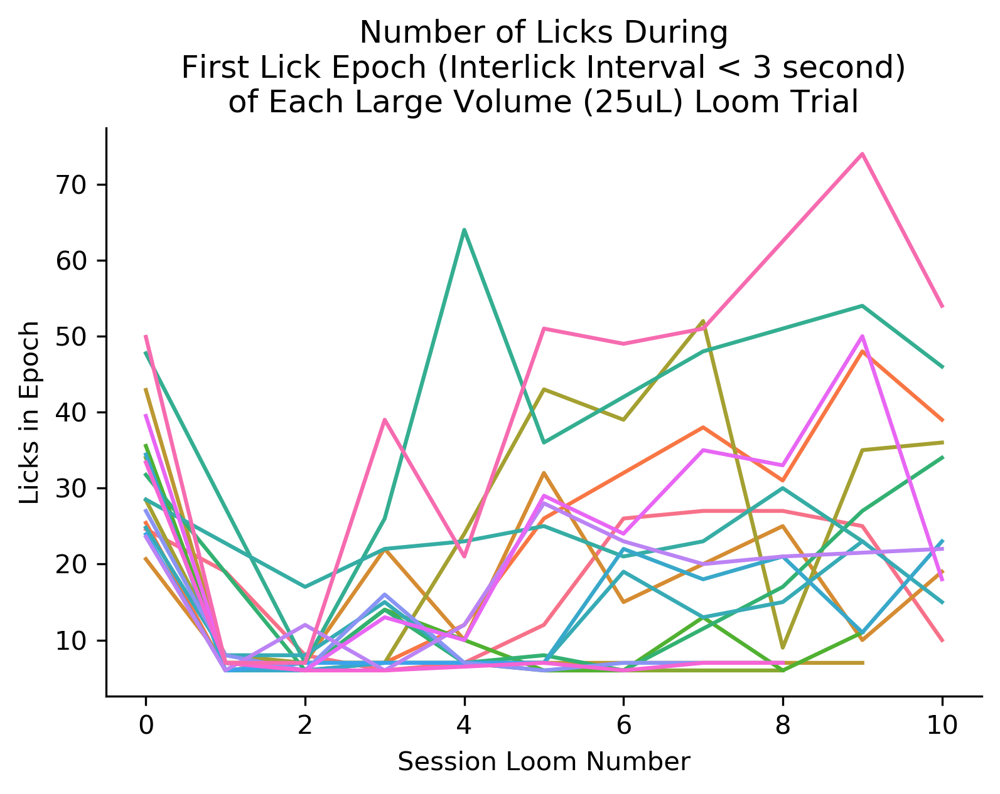

In [1269]:
plt.figure(figsize = (6,4), dpi =300)

DATA_N = sessionlickepochdf
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Epoch'])['Session Lick Epoch Number'].idxmin()].reset_index(drop=True)

ax = sns.lineplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Epoch with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Epoch',\
             hue = 'Projection Type')

ax = sns.stripplot(data = AAA[(AAA['Day'] == 'Day4') & (AAA['Most Recent Volume'] == 2000) &
                              ((AAA['Session Loom Number'] == 0) | (AAA['Lick Epoch with Loom'])) &
                                   (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Epoch',
             color = 'darkturquoise',
             edgecolor = 'black',
             linewidth = 0.5,
             size = 5,
             alpha = 0.3)


sns.despine(top = True, right = True)

plt.title('Number of Licks During\nFirst Lick Epoch (Interlick Interval < 3 second)\nof Each Large Volume (25uL) Loom Trial')

plt.legend([],[], frameon=False)

C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 66.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 77.8% of the points cann

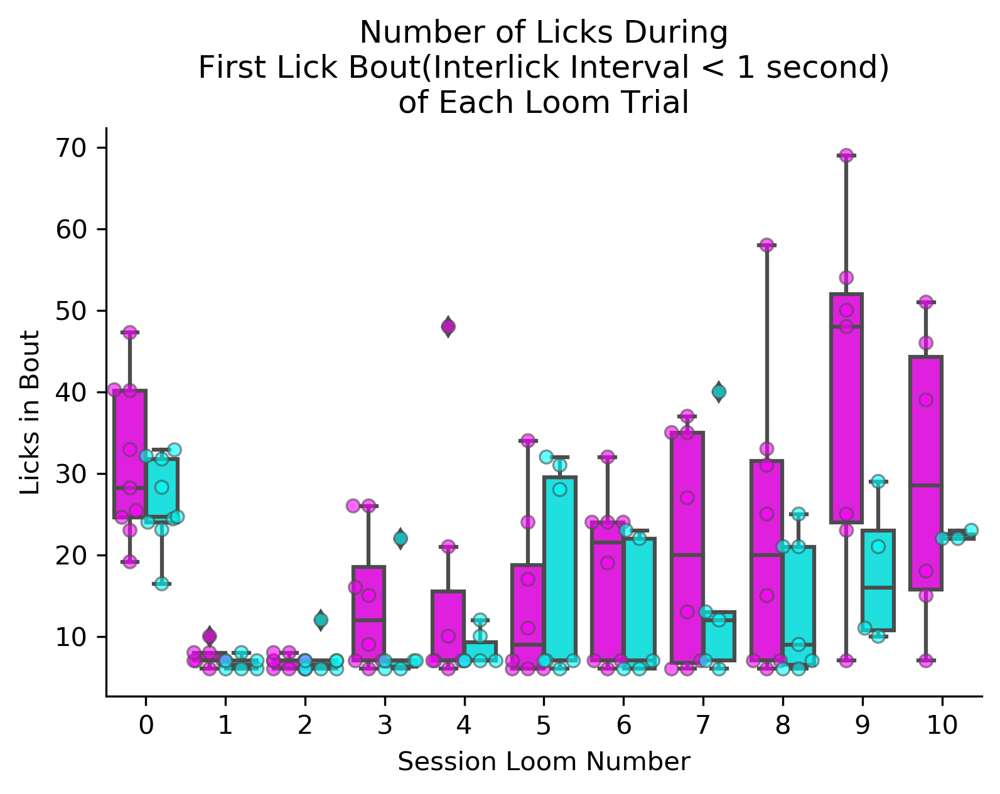

In [1105]:
plt.figure(figsize = (6,4), dpi =300)

DATA_N = sessionlickboutdf
AAA = DATA_N.loc[DATA_N[DATA_N['On Target Lick Bout']].groupby(['Mouse', 'Day', 'Trial Number at Start of Lick Bout'])['Session Lick Bout Number'].idxmin()].reset_index(drop=True)

ax = sns.boxplot(data = AAA[(AAA['Most Recent Volume'] == 2000) & (AAA['Day'] == 'Day4') & 
                            ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                            (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Projection Type', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Bout',
             hue = 'Projection Type',
             palette = ['Magenta', 'Cyan'])

ax = sns.swarmplot(data = AAA[(AAA['Most Recent Volume'] == 2000) & (AAA['Day'] == 'Day4') &
                              ((AAA['Session Loom Number'] == 0) | (AAA['Lick Bout with Loom'])) &
                                   (AAA['Session Loom Number'] < 11)].groupby(['Session Loom Number', 'Projection Type', 'Mouse']).mean().reset_index(),
             x = 'Session Loom Number',
             y = 'Licks in Bout',
             hue = 'Projection Type',
             palette = ['Magenta', 'Cyan'],
             linewidth = 0.8,
             size = 5,
             alpha = 0.6,
             dodge = True)


sns.despine(top = True, right = True)

plt.title('Number of Licks During\nFirst Lick Bout(Interlick Interval < 1 second)\nof Each Large Volume (25uL) Loom Trial')

plt.legend([],[], frameon=False)

C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 47.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 55.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Ryan\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 27.8% of the points cann

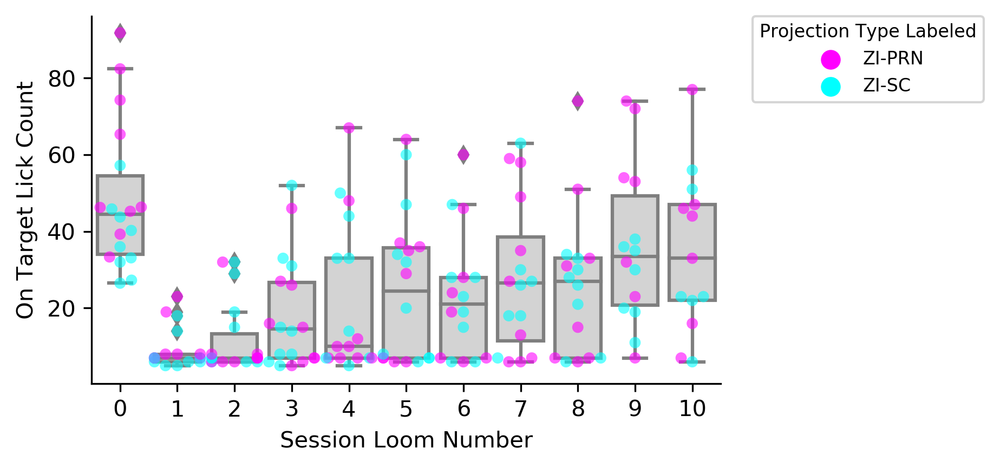

In [370]:
plt.figure(figsize = (5,3), dpi=300)

ax = sns.swarmplot(data = trialdf[(trialdf['Volumes'] == 2000) &
                             (trialdf['Day'] == 'Day4') &
                             (trialdf['Session Loom Number'] < 11) &
                             (trialdf['Active Port'] == '4')].groupby(['Mouse', 'Projection Type', 'Day', 'Session Loom Number']).mean().reset_index(),
                x = 'Session Loom Number',
                y = 'On Target Lick Count',
                alpha = 0.6,
                hue = 'Projection Type',
                palette = ['Magenta', 'Cyan'])

ax = sns.boxplot(data = trialdf[(trialdf['Volumes'] == 2000) &
                             (trialdf['Day'] == 'Day4') &
                             (trialdf['Session Loom Number'] < 11) &
                             (trialdf['Active Port'] == '4')].groupby(['Mouse', 'Projection Type', 'Day', 'Session Loom Number']).mean().reset_index(),
                x = 'Session Loom Number',
                y = 'On Target Lick Count',
                color = 'lightgrey')
                #hue = 'Projection Type',
                #palette = ['Magenta', 'Cyan'])

sns.despine(top = True, right = True)

plt.legend(bbox_to_anchor=(1.05, 1), 
           loc='upper left', 
           borderaxespad=0, 
           title = 'Projection Type Labeled', 
           title_fontsize = 8,
           fontsize = 8)

#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/BoxSwarm_OnTargetLickCount_vs_SessionLoomNumberTo10.svg', dpi=300, bbox_inches = 'tight')
#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/BoxSwarm_OnTargetLickCount_vs_SessionLoomNumberTo10.png', dpi=300, bbox_inches = 'tight')

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/3002984949.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.lineplot(data = trialdf[(trialdf['Volumes'] == 2000) &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/3002984949.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.lineplot(data = trialdf[(trialdf['Volumes'] == 2000) &


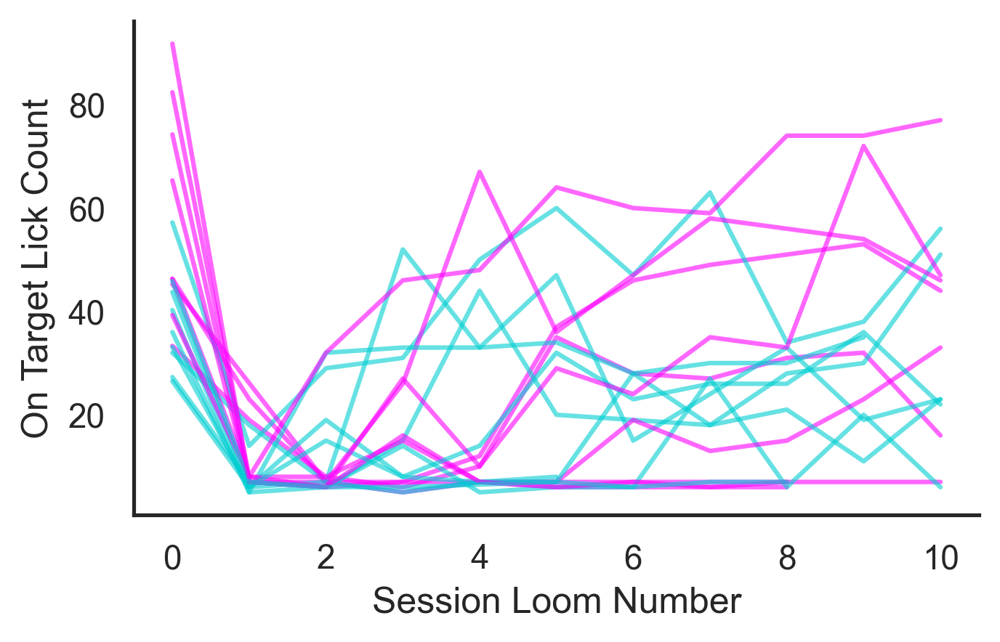

In [92]:
plt.figure(figsize = (5,3), dpi=300)

proj_palette = [projcmap[x] for x in trialdf['Mouse'].unique().tolist()]
ax = sns.lineplot(data = trialdf[(trialdf['Volumes'] == 2000) &
                             (trialdf['Day'] == 'Day4') &
                             (trialdf['Session Loom Number'] < 11) &
                             (trialdf['Active Port'] == 4)].groupby(['Mouse', 'Projection Type', 'Day', 'Session Loom Number']).mean().reset_index(),
                x = 'Session Loom Number',
                y = 'On Target Lick Count',
                alpha = 0.6,
                hue = 'Mouse',
                hue_order = trialdf['Mouse'].unique().tolist(),
                palette = proj_palette,
                ci = None)


sns.despine(top = True, right = True)


plt.legend([],[], frameon=False)

#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/Proj_Lineplot_OnTargetLickCount_vs_SessionLoomNumberTo10.svg', dpi=300, bbox_inches = 'tight')
#plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/Proj_Lineplot_OnTargetLickCount_vs_SessionLoomNumberTo10.png', dpi=300, bbox_inches = 'tight')

/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 36.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 51.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/

/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 36.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 51.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/

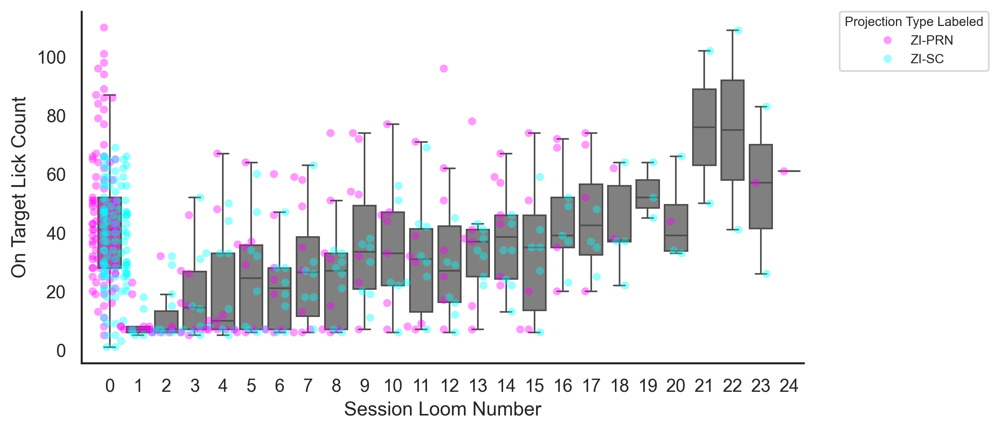

In [107]:
plt.figure(figsize = (8,4), dpi =300)
ax = sns.swarmplot(data = trialdf[(trialdf['Volumes'] == 2000) & 
                             (trialdf['Day'] == 'Day4')],
                x = 'Session Loom Number',
                y = 'On Target Lick Count',
                alpha = 0.4,
                hue = 'Projection Type',
                palette = ['Magenta', 'Cyan'],
                dodge = True
                ).set_xlim(-1,)

ax = sns.boxplot(data = trialdf[(trialdf['Volumes'] == 2000) & 
                     
                                (trialdf['Day'] == 'Day4')],
                x = 'Session Loom Number',
                y = 'On Target Lick Count',
                color = 'grey',
                showfliers = False,
                ).set_xlim(-1,)

sns.despine(top=True,right = True)

plt.legend(bbox_to_anchor=(1.05, 1), 
           loc='upper left', 
           borderaxespad=0, 
           title = 'Projection Type Labeled', 
           title_fontsize = 8,
           fontsize = 8,
           )

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/1433194006.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.boxplot(data=trialdf[(trialdf['Day'] == 'Day4') &
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/1433194006.py:20: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ax = sns.swarmplot(data=trialdf[(trialdf['Day'] == 'Day4') &
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 27.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarnin

Text(104.87499999999999, 0.5, 'Success Rate (%)')

/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 27.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 61.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:3370: UserWarning: 16.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/ryankast/opt/anaconda3/lib/python3.9/s

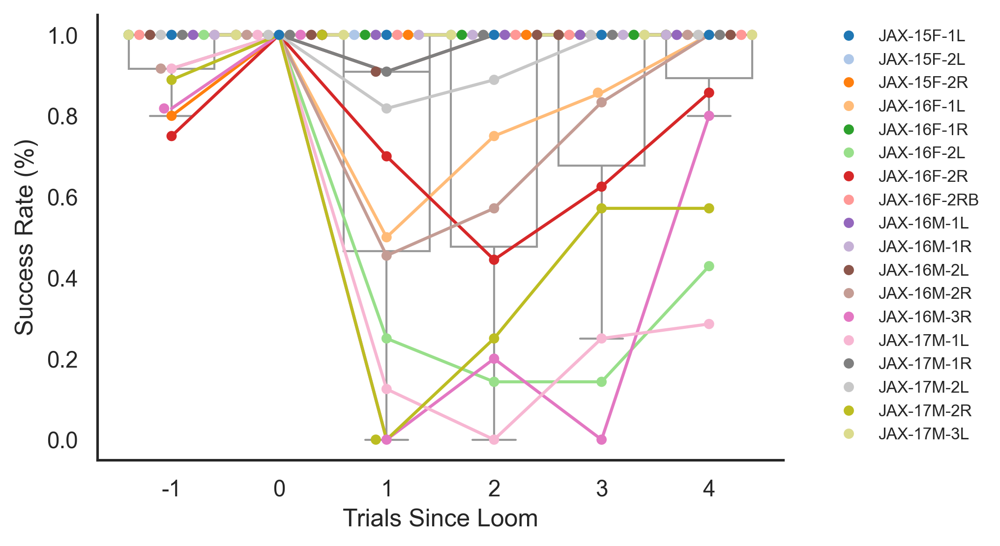

In [105]:
plt.figure(figsize = (6,4), dpi = 300)

# Get the 'cool_r' colormap
cmap = plt.get_cmap('cool')

# Create a custom colormap that maps negative values to black and uses 'cool_r' for positive values
colors = [(0.5, 0.5, 0.5)] + [cmap(i) for i in np.linspace(0, 1, 256)]

custom_cmap = plt.cm.colors.ListedColormap(colors)


ax = sns.boxplot(data=trialdf[(trialdf['Day'] == 'Day4') &
                                          (trialdf['Trials Since Loom'] < 5)].groupby(['Mouse', 'Trials Since Loom']).mean().reset_index(),
              x = 'Trials Since Loom',
              y = 'Digitized Trial Outcome',
              color = 'white', showfliers = False)



ax = sns.swarmplot(data=trialdf[(trialdf['Day'] == 'Day4') &
                                          (trialdf['Trials Since Loom'] < 5)].groupby(['Mouse', 'Trials Since Loom']).mean().reset_index(),
                x = 'Trials Since Loom',  
                  y = 'Digitized Trial Outcome',
                  hue = 'Mouse',
                  palette = 'tab20')

trialdf2 = trialdf.copy()
trialdf2['Trials Since Loom'] = trialdf['Trials Since Loom'] + 1

ax = sns.lineplot(data=trialdf2[(trialdf2['Day'] == 'Day4') &
                                          (trialdf2['Trials Since Loom'] < 6)].groupby(['Mouse', 'Trials Since Loom']).mean().reset_index(),
                 x = 'Trials Since Loom',  
                  y = 'Digitized Trial Outcome',
                  hue = 'Mouse',
                  palette = 'tab20')

sns.despine(top = True, right = True)
handles, labels = ax.get_legend_handles_labels() 

plt.legend(bbox_to_anchor=(1.05, 1), 
           loc='upper left', 
             frameon = False, labels = labels[:18], handles = handles[:18],
              fontsize = 8)

ax.set_ylabel('Success Rate (%)')

##plt.savefig('Z:/RKDATA/Behavior/FiberPhotometryData/Analysis/DND_DiscreteAnalysis/BehaviorFigures/SuccessRate_TrialsPastLoom_HueMouse.svg',bbox_inches = 'tight')

/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/4062004953.py:29: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.scatterplot(data=DATAZ,
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/4062004953.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (6,2), dpi =300)
/var/folders/m1/69xtflwj783f2sqshj3hmjtr0000gn/T/ipykernel_47789/4062004953.py:29: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.scatterplot(data=DATAZ,
No artists with la

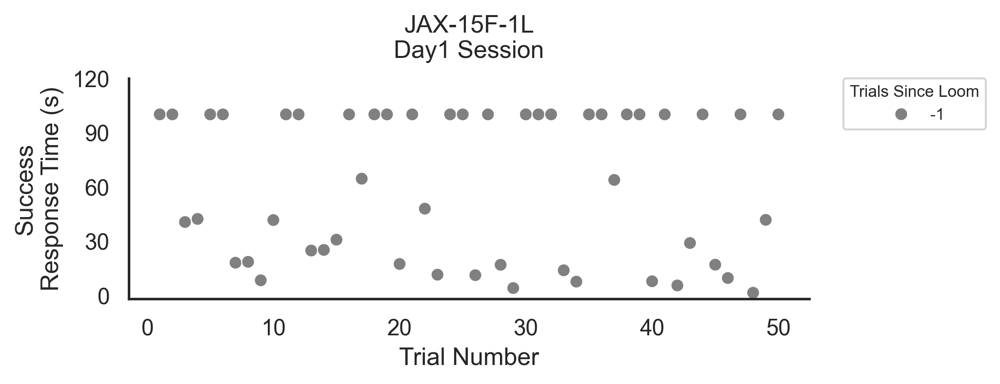

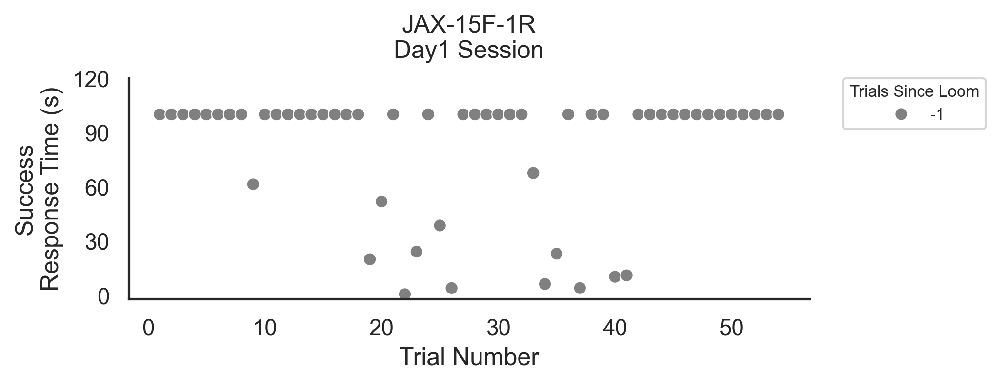

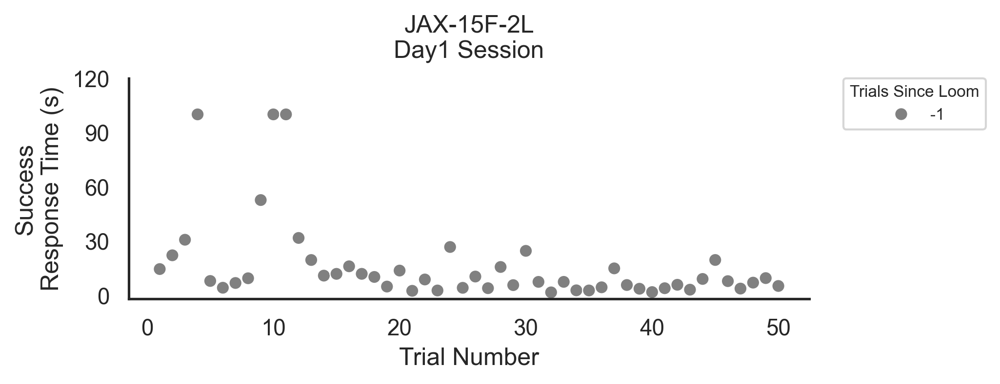

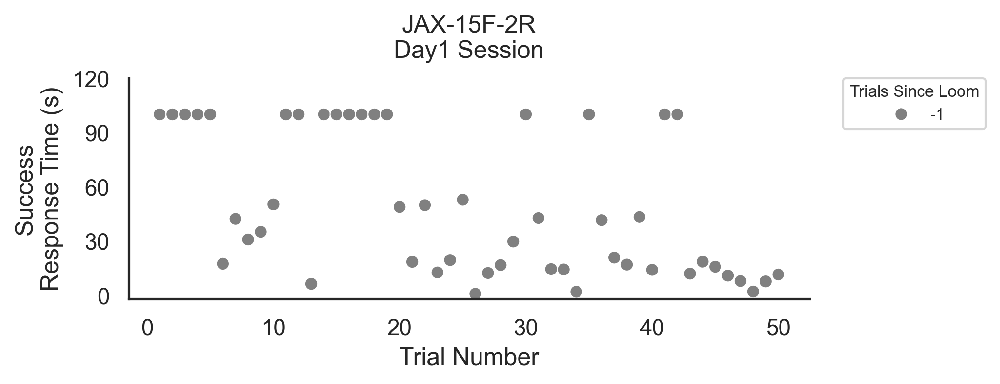

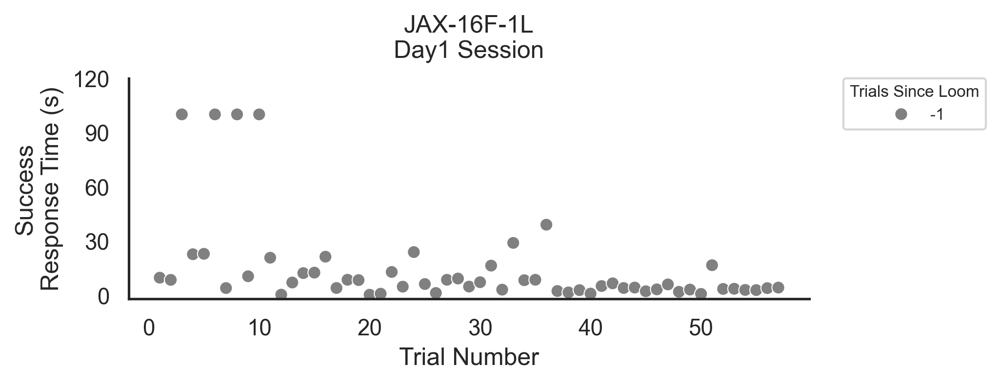

...

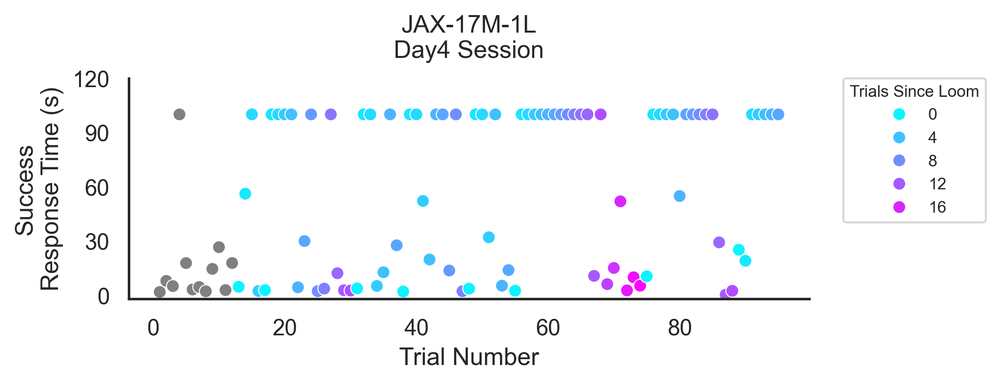

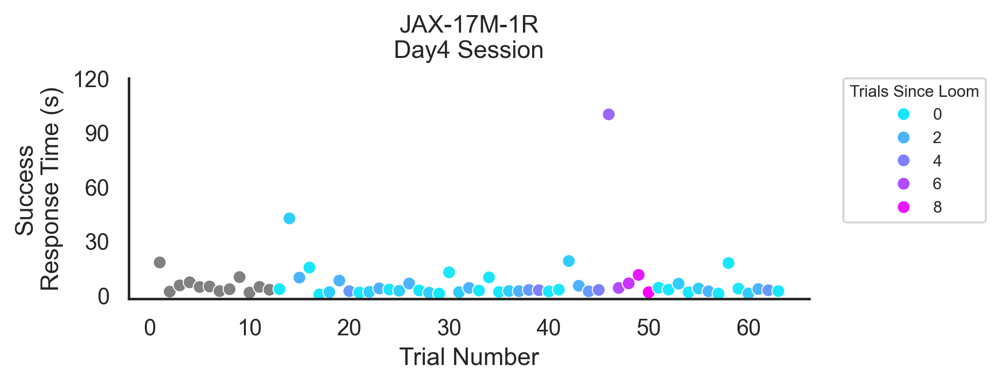

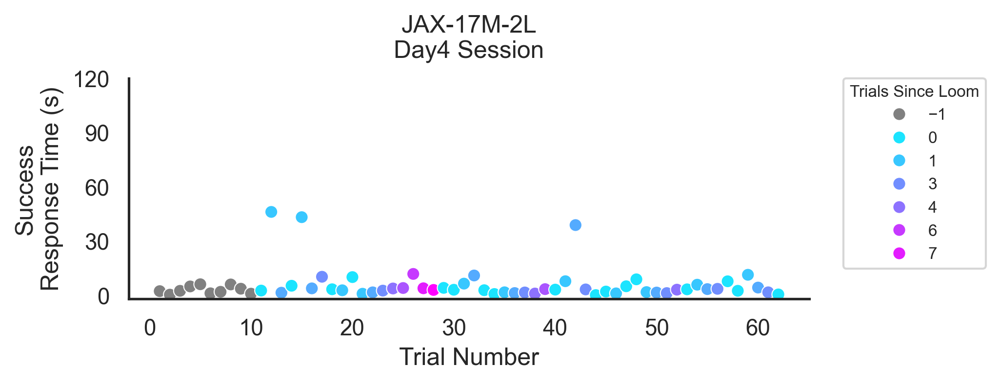

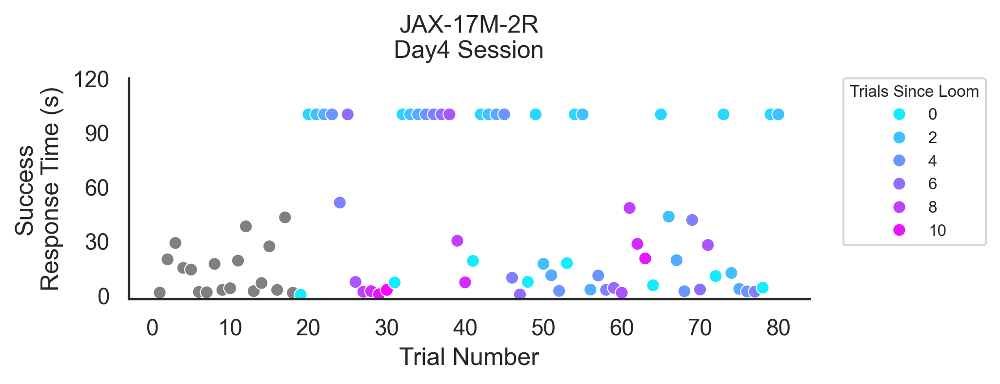

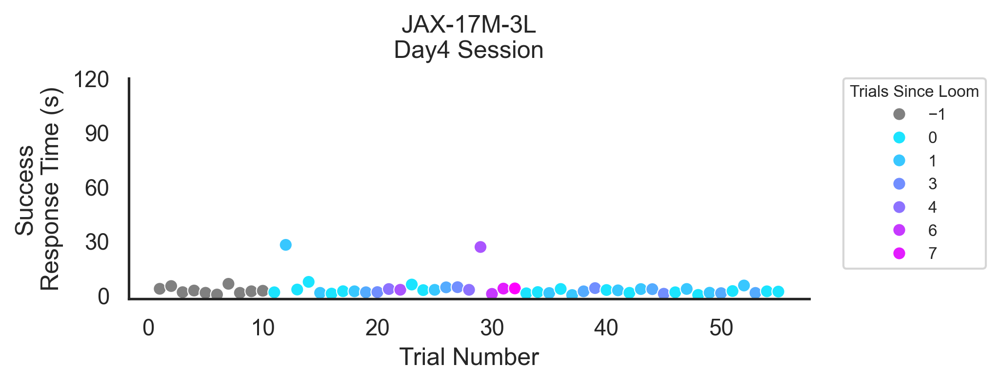

In [79]:
sns.set_theme(style = 'white', 
              font = 'helvetica',
              font_scale = 1)


for i in dfFullSet['Day'].unique().tolist():
    for j in dfFullSet['Mouse'].unique().tolist():
        plt.figure(figsize = (6,2), dpi =300)
        mouse = j
        day = i

        # Get the 'cool_r' colormap
        cmap = plt.get_cmap('cool')

        # Create a custom colormap that maps negative values to black and uses 'cool_r' for positive values
        colors = [(0.5, 0.5, 0.5)] + [cmap(i) for i in np.linspace(0, 1, 256)]

        custom_cmap = plt.cm.colors.ListedColormap(colors)

        DATAZ = trialdf[(trialdf['Mouse'] == mouse) & (trialdf['Day'] == day)]


        if len(DATAZ['Trials Since Loom'].unique().tolist()) > 1:
            labelnames = ['No Loom', 'Loom Trial']

        else:
            labelnames = ['No Loom']

        ax = sns.scatterplot(data=DATAZ,
                        s=40,
                        x='Trial Number',
                        y=DATAZ['Successful Response Time'] / 1000,
                        palette=custom_cmap,
                        hue='Trials Since Loom')

        plt.legend(
                   bbox_to_anchor=(1.05, 1), 
                   loc='upper left', 
                   borderaxespad=0, 
                   title = 'Trials Since Loom', 
                   title_fontsize = 8,
                   fontsize = 8)

        sns.despine(right=True,top =True)

        # Set y-axis tick labels
        #ytick_labels = ['Failure', 'Success']

        # Set y-axis tick positions and labels
        ax.set_yticks([0,30,60,90,120])
        ax.set_ylabel('Success\nResponse Time (s)')
        ax.set_ylim(-2,120)
        #ax.set_yticklabels(ytick_labels)
        ax.set_title(mouse + "\n" + day + " Session",pad=10)

        sns.despine(top = True, right = True)
        ##plt.savefig('/Users/ryankast/Documents/FengLab/Meetings/LabMeetings/FLM14/SessionResponseTimeData/' + mouse + ' ' + day + '.svg',bbox_inches = 'tight')
